<a href="https://colab.research.google.com/github/domanmat/OLS_airbnb/blob/main/3_airbnb_prague_apts_no_hosts_OLS_load.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Edycja biblioteki SweetViz
Jeśli chcesz skorzystać z SweetViz - poniżej kod do skutecznego zakomentowania linii w graph_numeric.py:
* za 1-szym razem uruchom tylko komórkę poniżej (bez komentarzy, ctrl+A & ctrl+/)
* zrób to tylko za 1-szym uruchomieniem i tylko tej komórki
* Runtime --> Restart session
* zakomentuj komórkę nr 2 (całą, tral+A & ctrl+/) i puść resztę



In [ ]:
# # Inne instalacje które warto wykonać tylko 1 raz - na początku:
# !pip install shap -qq
# !sudo apt-get install p7zip-full p7zip-rar -qq
# !pip install gdown -qq

# # Completely remove and reinstall SweetViz
# !pip uninstall sweetviz -y -qq
# !rm -rf /usr/local/lib/python3.12/dist-packages/sweetviz
# !pip install sweetviz -qq

# # Now apply the fix with a more robust approach
# file_path = '/usr/local/lib/python3.12/dist-packages/sweetviz/graph_numeric.py'

# with open(file_path, 'r') as f:
#     content = f.read()

# # Use string replacement to be precise
# old_section = """        gap_percent = config["Graphs"].getfloat("summary_graph_categorical_gap")

#         warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)
#         self.hist_specs = axs.hist(plot_data, weights = normalizing_weights, bins=self.num_bins, \\
#                                    rwidth = (100.0 - gap_percent) / 100.0)
#         warnings.filterwarnings('once', category=np.VisibleDeprecationWarning)

#         bin_limits = self.hist_specs[1]"""

# new_section = """        gap_percent = config["Graphs"].getfloat("summary_graph_categorical_gap")

#         # warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)
#         self.hist_specs = axs.hist(plot_data, weights = normalizing_weights, bins=self.num_bins, \\
#                                    rwidth = (100.0 - gap_percent) / 100.0)
#         # warnings.filterwarnings('once', category=np.VisibleDeprecationWarning)

#         bin_limits = self.hist_specs[1]"""

# content = content.replace(old_section, new_section)

# with open(file_path, 'w') as f:
#     f.write(content)

# print("✓ File fixed")

# # Verify
# print("\n=== Lines 69-76 ===")
# !sed -n '69,76p' /usr/local/lib/python3.12/dist-packages/sweetviz/graph_numeric.py

# # Clear cache
# !rm -rf /usr/local/lib/python3.12/dist-packages/sweetviz/__pycache__
# !find /usr/local/lib/python3.12/dist-packages/sweetviz -name "*.pyc" -delete

# print("\n✓ IMPORTANT: Restart runtime now (Runtime → Restart runtime)")

#Stowarzyszenie „Mieszkalnik” rozważa agresywną kampanię inwestycyjną w jednym z europejskich miast, ale potrzebuje Twojej wskazówki, od czego zacząć!

Kontekst: „Mieszkalnik”, stowarzyszenie właścicieli nieruchomości, rozważa agresywną kampanię inwestycyjną w jednym z europejskich miast.

Stowarzyszenie chce wybrać miasto, kierując się dobrą znajomością czynników wpływających na ceny najmu i umiejętnością prognozowania wyników najmu pozyskanych inwestycji.

Cel:
* opracowanie raportu na temat kształtowania się cen najmu Airbnb w wybranych miastach (wykorzystanie technik uczenia maszynowego)
* **rekomendacja miast**, w których Mieszkalnik może rozpocząć inwestycję jako pierwszy (założenie poziomu cen nieruchomości, rozważenie, jakie aspekty podniesienia cen najmu są najlepsze)
* przygotowanie się do przewidywania wyników najmu danej nieruchomości przez Dyrektora ds. Inwestycji Mieszkalnik.

**Odbiorcy:** Rada dyrektorów Mieszkalnik

Źródło danych: http://insideairbnb.com/get-the-data.html



**Zadania programisty:**
* Przygotuj dane (dla 2 miast)
* Załaduj dane do preferowanego narzędzia
* Wykorzystaj model regresji liniowej
* Wykorzystaj modele XGBoost + XAI
* Przekaż wyniki w sposób czytelny reszcie zespołu



Otrzymuje 3780 dolarów za czynsz w wysokości 3800 dolarów – grozi eksmisją
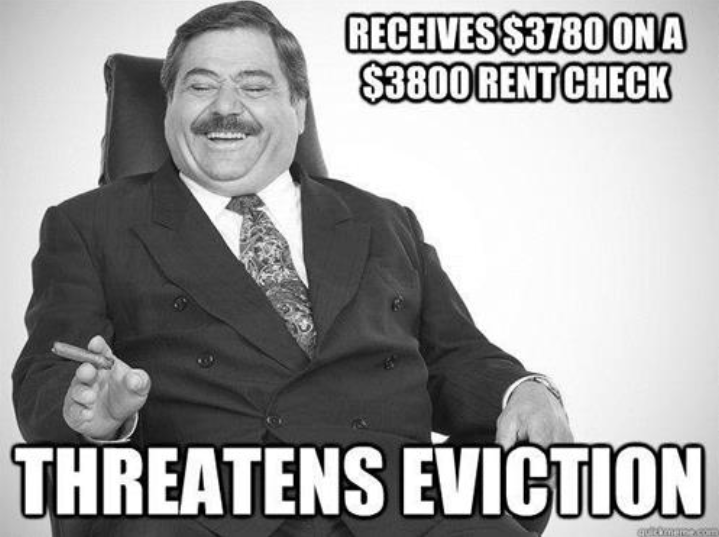


# What shapes Berlin AirBnB prices ?


## Import and load packages

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import lasso_path
import xgboost
import shap

In [ ]:
sns.set_style("whitegrid")

## Airbnb and Airbnb Open Data

**Airbnb** is a company that provides a platform for people to list, discover, and book accommodations around the world. As part of its commitment to transparency and open data, Airbnb has made some of its data available for public use.

The **Airbnb Open Data** initiative provides access to a variety of datasets related to Airbnb's business and the broader hospitality industry. These datasets are made available under an open data license, which allows anyone to access, use, and share the data for any purpose.

The Airbnb Open Data initiative includes a range of datasets, including:

* **Listings data**: This dataset includes information about properties listed on Airbnb, including the location, price, availability, and amenities of each property.

* **Reviews data**: This dataset includes reviews and ratings left by guests who have stayed at Airbnb properties.

* **Calendar data**: This dataset includes availability information for Airbnb properties, including dates when a property is booked or available for booking.

* **Demographic data**: This dataset includes information about the demographics of Airbnb users, including age, gender, and location.

* **Host data**: This dataset includes information about Airbnb hosts, including the properties they own or manage and the number of reviews they have received.

The Airbnb Open Data initiative is intended to help researchers, policymakers, and others better understand the hospitality industry and the impact of Airbnb on communities around the world. It is also intended to encourage the development of new tools, applications, and research that can help Airbnb and other companies improve their services and better meet the needs of their users.

Data is available here http://insideairbnb.com/get-the-data

In this notebook we will focus on **Listings data**  

**Listings data** is a dataset that includes information about properties listed on Airbnb. This dataset includes details about the
* location,
* price,
* availability, and
* amenities of each property.

Here are some examples of the types of information that might be included in the listings data:

* **Property type**: Is the property a private room, shared room, or entire home/apartment?

* **Location**: Where is the property located (e.g., city, state, country)?

* **Price**: How much does it cost to stay at the property?

* **Availability**: When is the property available for booking?

* **Amenities**: What amenities are available at the property (e.g., WiFi, laundry facilities, kitchen)?

* **Photos**: What does the property look like (e.g., interior, exterior)?

Listings data can be useful for understanding the types of properties that are available on Airbnb, as well as the prices and amenities offered. It can also be used to analyze trends in the hospitality industry and understand the demand for different types of accommodations. For example, researchers might use listings data to study the impact of Airbnb on the housing market in a particular city, or to **understand the factors that influence the popularity of different types of properties**.

## Get data

###Download

In [ ]:
# download data for Prague
import gdown
url = 'https://data.insideairbnb.com/czech-republic/prague/prague/2025-09-23/data/listings.csv.gz'

output = "listings_Prague.gz"
gdown.download(url, output)

Downloading...
From: https://data.insideairbnb.com/czech-republic/prague/prague/2025-09-23/data/listings.csv.gz
To: /content/listings_Prague.gz
100%|██████████| 5.58M/5.58M [00:00<00:00, 109MB/s]


'listings_Prague.gz'

In [ ]:
!ls -lah

total 5.4M
drwxr-xr-x 1 root root 4.0K Jan 14 20:42 .
drwxr-xr-x 1 root root 4.0K Jan 14 20:41 ..
drwxr-xr-x 4 root root 4.0K Dec 11 14:34 .config
-rw-r--r-- 1 root root 5.4M Jan 14 20:42 listings_Prague.gz
drwxr-xr-x 1 root root 4.0K Dec 11 14:34 sample_data


### Extract files

In [ ]:
# # # Install libraries to unzip all
# !sudo apt-get install p7zip-full p7zip-rar -qq
# Unrar rar file
!7z x {output} -y


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 5578702 bytes (5448 KiB)

Extracting archive: listings_Prague.gz
--
Path = listings_Prague.gz
Type = gzip
Headers Size = 23

  0% - listings.csv                   Everything is Ok

Size:       25418816
Compressed: 5578702


In [ ]:
!ls -lah

total 30M
drwxr-xr-x 1 root root 4.0K Jan 14 20:42 .
drwxr-xr-x 1 root root 4.0K Jan 14 20:41 ..
drwxr-xr-x 4 root root 4.0K Dec 11 14:34 .config
-rw-r--r-- 1 root root  25M Nov  7 10:09 listings.csv
-rw-r--r-- 1 root root 5.4M Jan 14 20:42 listings_Prague.gz
drwxr-xr-x 1 root root 4.0K Dec 11 14:34 sample_data


### Read data

In [ ]:
data_raw = pd.read_csv('listings.csv')

In [ ]:
# Print data info
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10834 entries, 0 to 10833
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            10834 non-null  int64  
 1   listing_url                                   10834 non-null  object 
 2   scrape_id                                     10834 non-null  int64  
 3   last_scraped                                  10834 non-null  object 
 4   source                                        10834 non-null  object 
 5   name                                          10834 non-null  object 
 6   description                                   10614 non-null  object 
 7   neighborhood_overview                         4458 non-null   object 
 8   picture_url                                   10833 non-null  object 
 9   host_id                                       10834 non-null 

### Raw Data

In [ ]:
# Pokaż wszystkie kolumny i 10 wierszy
pd.set_option('display.max_columns', None)     # Wszystkie kolumny
pd.set_option('display.width', 1000)           # Szerokość wyświetlania
pd.set_option('display.max_colwidth', 50)      # Max szerokość pojedynczej kolumny
pd.set_option('display.expand_frame_repr', False)  # Nie łam DataFrame na wiele linii
pd.set_option('display.max_rows', None)  # Wszystkie wiersze
data_raw.head(100).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
id,23163,23169,26755,30762,42514,52148,55856,75298,79373,79381,79387,79711,83067,83855,83856,85790,98852,106207,109549,111141,112281,117451,146690,167878,173114,176243,181641,181951,182072,182772,186750,201908,202545,207373,208007,209774,224386,224457,247267,254484,278550,279773,287716,287727,287734,293727,304027,318204,320262,324586,342963,342968,346142,408724,415145,448629,465196,474544,493375,498646,536364,537019,549837,561841,595310,599948,628063,647564,652527,652633,661323,662810,662817,667478,668858,668880,668902,668908,673821,679022,679276,681166,690105,691240,691380,692045,696261,696837,699944,701644,706726,707963,708571,711288,733462,735375,747785,757660,760597,777881
listing_url,https://www.airbnb.com/rooms/23163,https://www.airbnb.com/rooms/23169,https://www.airbnb.com/rooms/26755,https://www.airbnb.com/rooms/30762,https://www.airbnb.com/rooms/42514,https://www.airbnb.com/rooms/52148,https://www.airbnb.com/rooms/55856,https://www.airbnb.com/rooms/75298,https://www.airbnb.com/rooms/79373,https://www.airbnb.com/rooms/79381,https://www.airbnb.com/rooms/79387,https://www.airbnb.com/rooms/79711,https://www.airbnb.com/rooms/83067,https://www.airbnb.com/rooms/83855,https://www.airbnb.com/rooms/83856,https://www.airbnb.com/rooms/85790,https://www.airbnb.com/rooms/98852,https://www.airbnb.com/rooms/106207,https://www.airbnb.com/rooms/109549,https://www.airbnb.com/rooms/111141,https://www.airbnb.com/rooms/112281,https://www.airbnb.com/rooms/117451,https://www.airbnb.com/rooms/146690,https://www.airbnb.com/rooms/167878,https://www.airbnb.com/rooms/173114,https://www.airbnb.com/rooms/176243,https://www.airbnb.com/rooms/181641,https://www.airbnb.com/rooms/181951,https://www.airbnb.com/rooms/182072,https://www.airbnb.com/rooms/182772,https://www.airbnb.com/rooms/186750,https://www.airbnb.com/rooms/201908,https://www.airbnb.com/rooms/202545,https://www.airbnb.com/rooms/207373,https://www.airbnb.com/rooms/208007,https://www.airbnb.com/rooms/209774,https://www.airbnb.com/rooms/224386,https://www.airbnb.com/rooms/224457,https://www.airbnb.com/rooms/247267,https://www.airbnb.com/rooms/254484,https://www.airbnb.com/rooms/278550,https://www.airbnb.com/rooms/279773,https://www.airbnb.com/rooms/287716,https://www.airbnb.com/rooms/287727,https://www.airbnb.com/rooms/287734,https://www.airbnb.com/rooms/293727,https://www.airbnb.com/rooms/304027,https://www.airbnb.com/rooms/318204,https://www.airbnb.com/rooms/320262,https://www.airbnb.com/rooms/324586,https://www.airbnb.com/rooms/342963,https://www.airbnb.com/rooms/342968,https://www.airbnb.com/rooms/346142,https://www.airbnb.com/rooms/408724,https://www.airbnb.com/rooms/415145,https://www.airbnb.com/rooms/448629,https://www.airbnb.com/rooms/465196,https://www.airbnb.com/rooms/474544,https://www.airbnb.com/rooms/493375,https://www.airbnb.com/rooms/498646,https://www.airbnb.com/rooms/536364,https://www.airbnb.com/rooms/537019,https://www.airbnb.com/rooms/549837,https://www.airbnb.com/rooms/561841,https://www.airbnb.com/rooms/595310,https://www.airbnb.com/rooms/599948,https://www.airbnb.com/rooms/628063,https://www.airbnb.com/rooms/647564,https://www.airbnb.com/rooms/652527,https://www.airbnb.com/rooms/652633,https://www.airbnb.com/rooms/661323,https://www.airbnb.com/rooms/662810,https://www.airbnb.com/rooms/662817,https://www.airbnb.com/rooms/667478,https://www.airbnb.com/rooms/668858,https://www.airbnb.com/rooms/668880,https://www.airbnb.com/rooms/668902,https://www.airbnb.com/rooms/668908,https://www.airbnb.com/rooms/673821,https://www.airbnb.com/rooms/679022,https://www.airbnb.com/rooms/679276,https://www.airbnb.com/rooms/681166,https://www.airbnb.com/rooms/690105,https://www.airbnb.com/rooms/691240,http

In [ ]:
data_raw.head(10)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,23163,https://www.airbnb.com/rooms/23163,20250923203415,2025-09-24,previous scrape,Residence Karolina - KAROL12,"Unique and elegant apartment rental in Prague,...",NaN,https://a0.muscache.com/pictures/01bbe32c-3f13...,5282,https://www.airbnb.com/users/show/5282,Klara,2008-12-17,"Prague, Czechia","Hello, \r\nglad to see that you are interested...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/b7309...,https://a0.muscache.com/im/pictures/user/b7309...,Josefov,76.0,86.0,"['email', 'phone']",t,t,NaN,Praha 1,NaN,50.082290,14.41552,Entire rental unit,Entire home/apt,4,NaN,1 bath,1.0,NaN,"[""Dishwasher"", ""Dishes and silverware"", ""Crib""...",NaN,1,365,1.0,1.0,731.0,731.0,1.0,731.0,NaN,t,0,0,0,0,2025-09-24,31,0,0,0,1,0,NaN,2010-09-20,2024-06-15,4.90,4.83,5.00,5.00,4.97,4.93,4.86,NaN,t,75,74,0,0,0.17
1,23169,https://www.airbnb.com/rooms/23169,20250923203415,2025-09-24,city scrape,Residence Masna - Masna302,Masna studio offers a lot of space and privacy...,NaN,https://a0.muscache.com/pictures/b450cf2a-8561...,5282,https://www.airbnb.com/users/show/5282,Klara,2008-12-17,"Prague, Czechia","Hello, \r\nglad to see that you are interested...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/b7309...,https://a0.muscache.com/im/pictures/user/b7309...,Josefov,76.0,86.0,"['email', 'phone']",t,t,NaN,Praha 1,NaN,50.088300,14.42272,Entire rental unit,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Dishes and silverware"", ""Body soap"", ""Crib"",...",NaN,1,365,1.0,7.0,2.0,731.0,1.2,704.6,NaN,t,8,14,14,14,2025-09-24,124,3,0,14,8,18,NaN,2010-05-07,2025-06-25,4.74,4.60,4.83,4.81,4.86,4.97,4.69,NaN,t,75,74,0,0,0.66
2,26755,https://www.airbnb.com/rooms/26755,20250923203415,2025-09-24,city scrape,Central Prague Old Town Top Floor,Big and beautiful new attic apartment in the v...,This apartment offers a fantastic location. Yo...,https://a0.muscache.com/pictures/miso/Hosting-...,113902,https://www.airbnb.com/users/show/113902,Daniel+Bea,2010-04-26,"Prague, Czechia",Hi! we are a sp/cz couple with 2 daughters (La...,within an hour,100%,99%,t,https://a0.muscache.com/im/pictures/user/8db01...,https://a0.muscache.com/im/pictures/user/8db01...,Staré Město,4.0,4.0,"['email', 'phone']",t,t,"Prague, Hlavní město Praha, Czechia",Praha 1,NaN,50.087290,14.43179,Entire rental unit,Entire home/apt,4,1.5,1.5 baths,1.0,2.0,"[""Fire extinguisher"", ""Shower gel"", ""Hot water...","$2,272.00",3,700,2.0,5.0,1125.0,1125.0,3.0,1125.0,NaN,t,1,11,25,142,2025-09-24,440,54,2,25,57,255,579360.0,2015-05-19,2025-09-06,4.95,4.95,4.92,4.94,4.96,4.94,4.90,NaN,f,3

In [ ]:
print(data_raw.shape)
data_raw.head()

(10834, 79)


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,23163,https://www.airbnb.com/rooms/23163,20250923203415,2025-09-24,previous scrape,Residence Karolina - KAROL12,"Unique and elegant apartment rental in Prague,...",NaN,https://a0.muscache.com/pictures/01bbe32c-3f13...,5282,https://www.airbnb.com/users/show/5282,Klara,2008-12-17,"Prague, Czechia","Hello, \r\nglad to see that you are interested...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/b7309...,https://a0.muscache.com/im/pictures/user/b7309...,Josefov,76.0,86.0,"['email', 'phone']",t,t,NaN,Praha 1,NaN,50.08229,14.41552,Entire rental unit,Entire home/apt,4,NaN,1 bath,1.0,NaN,"[""Dishwasher"", ""Dishes and silverware"", ""Crib""...",NaN,1,365,1.0,1.0,731.0,731.0,1.0,731.0,NaN,t,0,0,0,0,2025-09-24,31,0,0,0,1,0,NaN,2010-09-20,2024-06-15,4.90,4.83,5.00,5.00,4.97,4.93,4.86,NaN,t,75,74,0,0,0.17
1,23169,https://www.airbnb.com/rooms/23169,20250923203415,2025-09-24,city scrape,Residence Masna - Masna302,Masna studio offers a lot of space and privacy...,NaN,https://a0.muscache.com/pictures/b450cf2a-8561...,5282,https://www.airbnb.com/users/show/5282,Klara,2008-12-17,"Prague, Czechia","Hello, \r\nglad to see that you are interested...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/b7309...,https://a0.muscache.com/im/pictures/user/b7309...,Josefov,76.0,86.0,"['email', 'phone']",t,t,NaN,Praha 1,NaN,50.08830,14.42272,Entire rental unit,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Dishes and silverware"", ""Body soap"", ""Crib"",...",NaN,1,365,1.0,7.0,2.0,731.0,1.2,704.6,NaN,t,8,14,14,14,2025-09-24,124,3,0,14,8,18,NaN,2010-05-07,2025-06-25,4.74,4.60,4.83,4.81,4.86,4.97,4.69,NaN,t,75,74,0,0,0.66
2,26755,https://www.airbnb.com/rooms/26755,20250923203415,2025-09-24,city scrape,Central Prague Old Town Top Floor,Big and beautiful new attic apartment in the v...,This apartment offers a fantastic location. Yo...,https://a0.muscache.com/pictures/miso/Hosting-...,113902,https://www.airbnb.com/users/show/113902,Daniel+Bea,2010-04-26,"Prague, Czechia",Hi! we are a sp/cz couple with 2 daughters (La...,within an hour,100%,99%,t,https://a0.muscache.com/im/pictures/user/8db01...,https://a0.muscache.com/im/pictures/user/8db01...,Staré Město,4.0,4.0,"['email', 'phone']",t,t,"Prague, Hlavní město Praha, Czechia",Praha 1,NaN,50.08729,14.43179,Entire rental unit,Entire home/apt,4,1.5,1.5 baths,1.0,2.0,"[""Fire extinguisher"", ""Shower gel"", ""Hot water...","$2,272.00",3,700,2.0,5.0,1125.0,1125.0,3.0,1125.0,NaN,t,1,11,25,142,2025-09-24,440,54,2,25,57,255,579360.0,2015-05-19,2025-09-06,4.95,4.95,4.92,4.94,4.96,4.94,4.90,NaN,f,3,3,

### Filter data rows

In [ ]:
# Usuwa wiersze niebędące domami/apartamentami
data_raw = data_raw[data_raw['room_type'] == 'Entire home/apt']

### Filter data columns

In [ ]:
# Usuń wszystkie kolumny zawierające 'host' (case-insensitive)
columns_to_drop = [col for col in data_raw.columns if 'host' in col.lower()]
data_raw = data_raw.drop(columns=columns_to_drop)

print(f"Usunięto {len(columns_to_drop)} kolumn zawierających 'host'")
print(f"Usunięte kolumny: {columns_to_drop}")

Usunięto 22 kolumn zawierających 'host'
Usunięte kolumny: ['host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms']


In [ ]:
# Usuń wszystkie kolumny zawierające 'review' (case-insensitive)
columns_to_drop = [col for col in data_raw.columns if 'review' in col.lower()]
data_raw = data_raw.drop(columns=columns_to_drop)

print(f"Usunięto {len(columns_to_drop)} kolumn zawierających 'review'")
print(f"Usunięte kolumny: {columns_to_drop}")

Usunięto 14 kolumn zawierających 'review'
Usunięte kolumny: ['number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'number_of_reviews_ly', 'first_review', 'last_review', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month']


# Analysis and Data preparation (EDA with SweetViz)

### Report

In [ ]:
# # Verify the changes
# !ls /usr/local/lib/python3.12/dist-packages/sweetviz/
# !sed -n '69,76p' /usr/local/lib/python3.12/dist-packages/sweetviz/graph_numeric.py

# # Run sweet wiz analysis
# import sweetviz as sv
# import warnings
# warnings.filterwarnings('ignore')

# my_report = sv.analyze(data_raw, pairwise_analysis="off")
# my_report.show_notebook()

In [ ]:
data_raw.head(10)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,availability_eoy,estimated_occupancy_l365d,estimated_revenue_l365d,license,instant_bookable
0,23163,https://www.airbnb.com/rooms/23163,20250923203415,2025-09-24,previous scrape,Residence Karolina - KAROL12,"Unique and elegant apartment rental in Prague,...",NaN,https://a0.muscache.com/pictures/01bbe32c-3f13...,NaN,Praha 1,NaN,50.082290,14.41552,Entire rental unit,Entire home/apt,4,NaN,1 bath,1.0,NaN,"[""Dishwasher"", ""Dishes and silverware"", ""Crib""...",NaN,1,365,1.0,1.0,731.0,731.0,1.0,731.0,NaN,t,0,0,0,0,2025-09-24,0,0,NaN,NaN,t
1,23169,https://www.airbnb.com/rooms/23169,20250923203415,2025-09-24,city scrape,Residence Masna - Masna302,Masna studio offers a lot of space and privacy...,NaN,https://a0.muscache.com/pictures/b450cf2a-8561...,NaN,Praha 1,NaN,50.088300,14.42272,Entire rental unit,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Dishes and silverware"", ""Body soap"", ""Crib"",...",NaN,1,365,1.0,7.0,2.0,731.0,1.2,704.6,NaN,t,8,14,14,14,2025-09-24,14,18,NaN,NaN,t
2,26755,https://www.airbnb.com/rooms/26755,20250923203415,2025-09-24,city scrape,Central Prague Old Town Top Floor,Big and beautiful new attic apartment in the v...,This apartment offers a fantastic location. Yo...,https://a0.muscache.com/pictures/miso/Hosting-...,"Prague, Hlavní město Praha, Czechia",Praha 1,NaN,50.087290,14.43179,Entire rental unit,Entire home/apt,4,1.5,1.5 baths,1.0,2.0,"[""Fire extinguisher"", ""Shower gel"", ""Hot water...","$2,272.00",3,700,2.0,5.0,1125.0,1125.0,3.0,1125.0,NaN,t,1,11,25,142,2025-09-24,25,255,579360.0,NaN,f
3,30762,https://www.airbnb.com/rooms/30762,20250923203415,2025-09-24,city scrape,Residence Rybna - Rybna23,"We offer a modern, comfortable, serviced apart...",NaN,https://a0.muscache.com/pictures/dfbb2fc2-91a0...,NaN,Praha 1,NaN,50.088210,14.42623,Entire serviced apartment,Entire home/apt,6,1.0,1 bath,2.0,3.0,"[""Dishwasher"", ""Dishes and silverware"", ""Crib""...",NaN,1,365,1.0,7.0,60.0,731.0,1.4,685.0,NaN,t,19,25,25,25,2025-09-24,25,6,NaN,NaN,t
4,42514,https://www.airbnb.com/rooms/42514,20250923203415,2025-09-24,city scrape,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old ...",*NEWLY* Furnished 1-bedroom apartment on the f...,NaN,https://a0.muscache.com/pictures/7f66bc43-25c7...,NaN,Praha 1,NaN,50.082280,14.41345,Entire rental unit,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Fire extinguisher"", ""Dishes and silverware"",...","$2,885.00",7,365,7.0,7.0,365.0,365.0,7.0,365.0,NaN,t,27,57,87,362,2025-09-24,96,0,0.0,NaN,f
5,52148,https://www.airbnb.com/rooms/52148,20250923203415,2025-09-24,city scrape,Colorful 2BDR Family Apartment,-The apartment has a self-check-in through a l...,Nestled seamlessly between Prague's Old and Ne...,https://a0.muscache.com/pictures/prohost-api/H...,"Prague, Hlavní město Praha, Czechia",Praha 2,NaN,50.070900,14.43157,Entire rental unit,Entire home/apt,7,1.0,1 bath,1.0,4.0,"[""Shower gel"", ""Hot water kettle"", ""Dishes and...","$2,497.00",1,365,1.0,5.0,1125.0,1125.0,2.0,1125.0,NaN,t,5,27,54,121,2025-09-24,63,198,494406.0,NaN,t
6,55856,https://www.airbnb.com/rooms/55856,20250923203415,2025-09-24,city scrape,Renovated Apartment behind National Museum,"Cozy and well-equipped, this Prague apartment ...",Nestled at the crossroads of Prague's storied ...,https://a0.muscache.com/pictures/prohost-api/H...,"Prague, Hlavní město Praha, Czechia",Praha 2,NaN,50.077240,14.43383,Entire rental unit,Entire home/apt,4,1.0,1 bath,1.0,2.0,"[""Shower gel"", ""Hot 

# Prepare the target varaible = price
(ma tylko 65% kompletności danych)

### Process data

In [ ]:
# Drop columns with NaNs greater than the threshold
# data = data_raw.dropna(axis=1, thresh= 0.8*data_raw.shape[0]).copy()
data_price = data_raw.dropna(subset=['price']).copy()
# data = data_price.dropna(axis=1, thresh=0.75*data_price.shape[0])
data = data_price.dropna(axis=1, thresh=0.8*data_price.shape[0])
print(len(data))

print(data.shape)
print(data.head(10))

8127
(8127, 38)
       id                         listing_url       scrape_id last_scraped       source                                               name                                        description                                        picture_url neighbourhood_cleansed   latitude  longitude       property_type        room_type  accommodates  bathrooms bathrooms_text  bedrooms  beds                                          amenities      price  minimum_nights  maximum_nights  minimum_minimum_nights  maximum_minimum_nights  minimum_maximum_nights  maximum_maximum_nights  minimum_nights_avg_ntm  maximum_nights_avg_ntm has_availability  availability_30  availability_60  availability_90  availability_365 calendar_last_scraped  availability_eoy  estimated_occupancy_l365d  estimated_revenue_l365d instant_bookable
2   26755  https://www.airbnb.com/rooms/26755  20250923203415   2025-09-24  city scrape                  Central Prague Old Town Top Floor  Big and beautiful new attic apar

### Cloumn names list

In [ ]:
data.head(100).T

,2,4,5,6,7,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,32,33,34,36,37,38,39,40,41,45,47,48,49,50,51,52,53,54,56,57,59,60,62,64,65,66,67,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,86,87,88,89,90,91,92,95,96,98,99,100,101,105,106,107,108,109,110,112,113,114,117,118,121,122,123,124,125,126,127,128,131
id,26755,42514,52148,55856,75298,83067,83855,83856,85790,98852,106207,109549,111141,112281,117451,146690,167878,173114,176243,181641,181951,182072,182772,186750,202545,207373,208007,224386,224457,247267,254484,278550,279773,293727,318204,320262,324586,342963,342968,346142,408724,415145,465196,474544,498646,536364,549837,595310,599948,628063,647564,652633,661323,662810,662817,667478,668858,668880,668902,668908,673821,679022,679276,681166,690105,691240,691380,696261,696837,699944,701644,706726,707963,708571,735375,747785,760597,777881,780659,780866,790196,797201,814677,814687,814691,814705,820954,822456,843670,874212,874482,888475,933583,933836,935534,939413,970935,976660,977301,993197
listing_url,https://www.airbnb.com/rooms/26755,https://www.airbnb.com/rooms/42514,https://www.airbnb.com/rooms/52148,https://www.airbnb.com/rooms/55856,https://www.airbnb.com/rooms/75298,https://www.airbnb.com/rooms/83067,https://www.airbnb.com/rooms/83855,https://www.airbnb.com/rooms/83856,https://www.airbnb.com/rooms/85790,https://www.airbnb.com/rooms/98852,https://www.airbnb.com/rooms/106207,https://www.airbnb.com/rooms/109549,https://www.airbnb.com/rooms/111141,https://www.airbnb.com/rooms/112281,https://www.airbnb.com/rooms/117451,https://www.airbnb.com/rooms/146690,https://www.airbnb.com/rooms/167878,https://www.airbnb.com/rooms/173114,https://www.airbnb.com/rooms/176243,https://www.airbnb.com/rooms/181641,https://www.airbnb.com/rooms/181951,https://www.airbnb.com/rooms/182072,https://www.airbnb.com/rooms/182772,https://www.airbnb.com/rooms/186750,https://www.airbnb.com/rooms/202545,https://www.airbnb.com/rooms/207373,https://www.airbnb.com/rooms/208007,https://www.airbnb.com/rooms/224386,https://www.airbnb.com/rooms/224457,https://www.airbnb.com/rooms/247267,https://www.airbnb.com/rooms/254484,https://www.airbnb.com/rooms/278550,https://www.airbnb.com/rooms/279773,https://www.airbnb.com/rooms/293727,https://www.airbnb.com/rooms/318204,https://www.airbnb.com/rooms/320262,https://www.airbnb.com/rooms/324586,https://www.airbnb.com/rooms/342963,https://www.airbnb.com/rooms/342968,https://www.airbnb.com/rooms/346142,https://www.airbnb.com/rooms/408724,https://www.airbnb.com/rooms/415145,https://www.airbnb.com/rooms/465196,https://www.airbnb.com/rooms/474544,https://www.airbnb.com/rooms/498646,https://www.airbnb.com/rooms/536364,https://www.airbnb.com/rooms/549837,https://www.airbnb.com/rooms/595310,https://www.airbnb.com/rooms/599948,https://www.airbnb.com/rooms/628063,https://www.airbnb.com/rooms/647564,https://www.airbnb.com/rooms/652633,https://www.airbnb.com/rooms/661323,https://www.airbnb.com/rooms/662810,https://www.airbnb.com/rooms/662817,https://www.airbnb.com/rooms/667478,https://www.airbnb.com/rooms/668858,https://www.airbnb.com/rooms/668880,https://www.airbnb.com/rooms/668902,https://www.airbnb.com/rooms/668908,https://www.airbnb.com/rooms/673821,https://www.airbnb.com/rooms/679022,https://www.airbnb.com/rooms/679276,https://www.airbnb.com/rooms/681166,https://www.airbnb.com/rooms/690105,https://www.airbnb.com/rooms/691240,https://www.airbnb.com/rooms/691380,https://www.airbnb.com/rooms/696261,https://www.airbnb.com/rooms/696837,https://www.airbnb.com/rooms/699944,https://www.airbnb.com/rooms/701644,https://www.airbnb.com/rooms/706726,https://www.airbnb.com/rooms/707963,https://www.airbnb.com/rooms/708571,https://www.airbnb.com/rooms/735375,https://www.airbnb.com/rooms/747785,https://www.airbnb.com/rooms/760597,https://www.airbnb.com/rooms/777881,https://www.airbnb.com/rooms/780659,https://www.airbnb.com/rooms/780866,https://www.airbnb.com/rooms/790196,https://www.airbnb.com/rooms/797201,https://www.airbnb.com/rooms/814677

In [ ]:
print(f"Original data shape: {data_raw.shape}")
print(f"Data shape after dropping columns with 'price' NaNs: {data_price.shape}")
print(f"Data shape after dropping columns with NaNs: {data.shape}")

Original data shape: (8973, 43)
Data shape after dropping columns with 'price' NaNs: (8127, 43)
Data shape after dropping columns with NaNs: (8127, 38)


In [ ]:
data.price.head()
# Oups, our price is a string, it has to be cleaned!
# need to clean and convert it to float

,price
2,"$2,272.00"
4,"$2,885.00"
5,"$2,497.00"
6,"$2,055.00"
7,"$1,571.00"


### Cast the target (price) to float

Cast price column to float (replace "$", "," and cast to "float")

**Price - kwoty podane w CZK przeliczone na EURO!!!**

In [ ]:
# Process
data.price.str.replace("$","").str.replace(",","").astype("float").describe()

# Cast price as float
data.price = data.price.apply(lambda x: x.replace("$", ""))
data.price = data.price.apply(lambda x: x.replace(",", ""))
data.price = data.price.astype("float")

# Przekształć liniowo: price/100*4.11 - kurs 100 koron = 4,11 eur
data.price = data.price / 100 * 4.11

data.price.describe()

/tmp/ipython-input-2462309413.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.price = data.price.apply(lambda x: x.replace("$", ""))
/tmp/ipython-input-2462309413.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.price = data.price.apply(lambda x: x.replace(",", ""))
/tmp/ipython-input-2462309413.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

,price
count,8127.000000
mean,170.832552
std,666.690084
min,13.028700
25%,68.431500
50%,92.927100
75%,136.061550
max,9974.559000


### Outlier deletion

LIKWIDACJA OUTLIERÓW, po co?

Słabo modelują dane.

Odcięcie 99, 98, 95 percentyla - ok.
Podobnie odcięcie 1,2,5 percentyla.

In [ ]:
data.price.describe()

,price
count,8127.000000
mean,170.832552
std,666.690084
min,13.028700
25%,68.431500
50%,92.927100
75%,136.061550
max,9974.559000


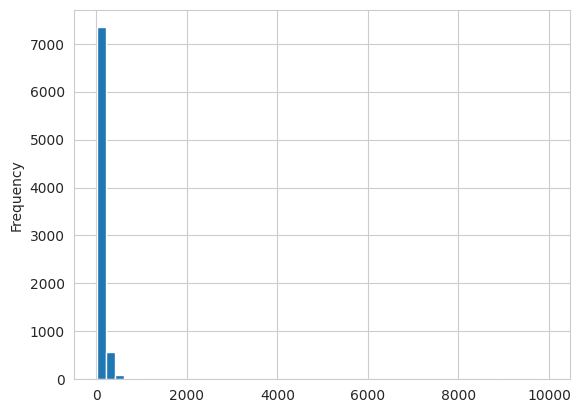

In [ ]:
# Mhm, we have outliers which seem to be to-be-deleted-errors
data.price.plot.hist(bins=50)
plt.show()

In [ ]:
# Getting rid of outliers
threshold_top=(np.percentile(data.price, 95))
threshold_bottom=(np.percentile(data.price, 5))
print("95% properties have a price lower than {0: .2f}".format(threshold_top))
print("95% properties have a price higher than {0: .2f}".format(threshold_bottom))
data_cut = data[(data.price <= threshold_top) & (data.price > threshold_bottom)]
all_data=data
data = data_cut
print(all_data.shape, data.shape)

95% properties have a price lower than  297.85
95% properties have a price higher than  47.59
(8127, 38) (7312, 38)


<Axes: ylabel='Frequency'>

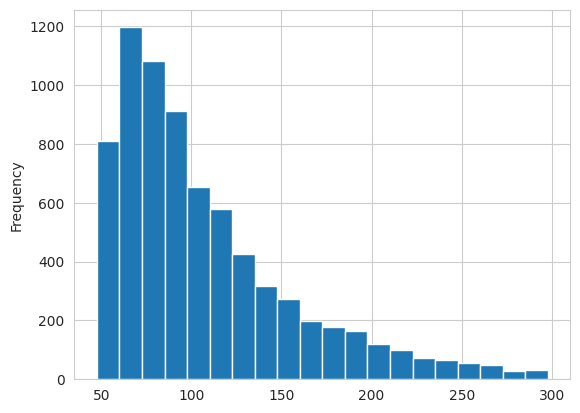

In [ ]:
all_data.query(f'price > {threshold_bottom} & price < {threshold_top}').price.plot.hist(bins=20)

# DANE DO MODELU - X


## Utworzenie zbioru treningowego i testowego - nie używane

### Stratyfikacja

In [ ]:
# Percentyle dla stratyfikacji
percentiles = np.percentile(data['price'], [25, 50, 75])
print(f"Percentyle: {percentiles}")

# Tworzy kategorie na podstawie percentyli
data['price_category'] = pd.cut(data['price'],
                                bins=[0] + list(percentiles) + [data['price'].max()],
                                labels=['Q1', 'Q2', 'Q3', 'Q4'],
                                include_lowest=True)

data['price_category'].value_counts()

Percentyle: [ 70.4865  92.9682 129.2595]


/tmp/ipython-input-509507388.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price_category'] = pd.cut(data['price'],


,count
price_category,
Q1,1831
Q3,1830
Q4,1826
Q2,1825


In [ ]:
# Wybieramy model ze stratyfikacją
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data,
                                                    data.price,
                                                    test_size=0.20,
                                                    random_state=42,
                                                    stratify=data['price_category'])

/tmp/ipython-input-2788691802.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled = df.groupby('category', group_keys=False).apply(


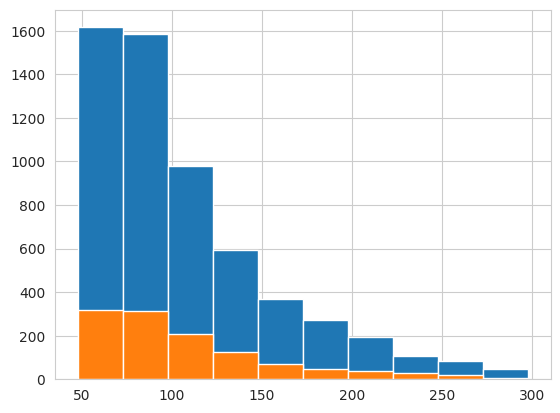

In [ ]:
def percentile_bins(series, n_bins):
    """Zwraca granice n_bins równych percentyli"""
    bins = np.percentile(series, np.linspace(0, 100, n_bins + 1))
    categories = pd.cut(series, bins=bins, labels=False, include_lowest=True)
    return bins, categories

# Użycie:
bins, categories = percentile_bins(y_train, 10)

df = pd.DataFrame({'values': y_train, 'category': categories})

sampled = df.groupby('category', group_keys=False).apply(
        lambda x: x.sample(frac=0.2, random_state=42)
    )
plt.hist(y_train)
plt.hist(sampled['values'], bins=10)
plt.show()

In [ ]:
# Dla porównania - dane bez stratyfikacji
from sklearn.model_selection import train_test_split
X_train_no, X_test_no, y_train_no, y_test_no = train_test_split(data,
                                                    data.price,
                                                    test_size=0.20,
                                                    random_state=42)

(<Axes: >, <Axes: >, <Axes: >)

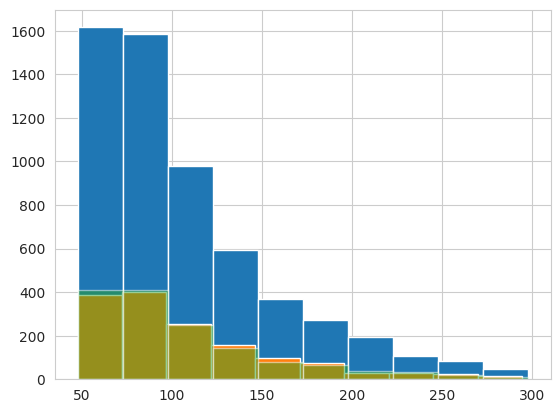

In [ ]:
# porównanie danych bez stratyfikacji i ze stratyfikacją
y_train.hist(), y_test.hist(), y_test_no.hist(alpha=0.5)

## Braki
Zastąpienie brakujących danych:
* dane numeryczne - zastąpienie średnią
* dane kategoryczne - zastąpienie najczęściej występującą



In [ ]:
# from sklearn.impute import SimpleImputer

# numeric_cols     = X_train.select_dtypes(include=['number']).columns
# categorical_cols = X_train.select_dtypes(include=['object', 'category']).columns

# numeric_imputer     = SimpleImputer(strategy='mean')
# categorical_imputer = SimpleImputer(strategy='most_frequent')

# # Apply imputer to numeric columns
# X_train[numeric_cols]     = numeric_imputer.fit_transform(X_train[numeric_cols])
# X_train[categorical_cols] = categorical_imputer.fit_transform(X_train[categorical_cols])

# # Apply imputer to numeric columns
# X_test[numeric_cols]     = numeric_imputer.transform(X_test[numeric_cols])
# X_test[categorical_cols] = categorical_imputer.transform(X_test[categorical_cols])


In [ ]:
# X_train.shape, X_test.shape
# # ((5849, 39), (1463, 39)) przy zastępowaniu braków

In [ ]:
# Usuń wiersze z brakującymi danymi
X_train = X_train.dropna()
X_test = X_test.dropna()
X = data.dropna()
data = data.dropna()

# Opcjonalnie - wyświetl informacje o usuniętych wierszach
print(f"Rozmiar X_train po usunięciu braków: {X_train.shape}")
print(f"Rozmiar X_test po usunięciu braków: {X_test.shape}")
print(f"Rozmiar X po usunięciu braków: {X.shape}")
print(f"Rozmiar data po usunięciu braków: {X.shape}")

Rozmiar X_train po usunięciu braków: (5719, 39)
Rozmiar X_test po usunięciu braków: (1432, 39)
Rozmiar X po usunięciu braków: (7151, 39)
Rozmiar data po usunięciu braków: (7151, 39)


## Create New Features


### New Variable - Lokalizacja względem innych Airbnb
Średnia z jednej i drugiej współrzędnej powinna dać centrum.

Ale nie musi, może lepiej dać centrum Berlina?

In [ ]:
data = data.copy()

# data['lat_dist_mean']  = data['latitude'].apply(lambda x: (x-np.mean( data['latitude']))**2)
# data['lon_dist_mean']  = data['longitude'].apply(lambda x: (x-np.mean( data['longitude']))**2)

lat_mean = data['latitude'].mean()
lon_mean = data['longitude'].mean()

data['lat_dist_mean'] = (data['latitude'] - lat_mean) ** 2
data['lon_dist_mean'] = (data['longitude'] - lon_mean) ** 2
data['lat_dist_mean_sqrt'] = np.sqrt((data['latitude'] - lat_mean) ** 2)
data['lon_dist_mean_sqrt'] = np.sqrt((data['longitude'] - lon_mean) ** 2)


### New Variable - Distance from city centre
odległość od średniej z odległości ze współrzędnych

to nie jest odległość od centrum berlina - odległość od centrum powinna być lepsza - zmienić

In [ ]:
# Punkt referencyjny - Praski zegar astronomiczny
ref_lat = 50.087101535185525
ref_lon = 14.420685907440566

# Obliczanie kwadratu odległości od punktu referencyjnego
data['lat_dist_centre'] = (data['latitude'] - ref_lat) ** 2
data['lon_dist_centre'] = (data['longitude'] - ref_lon) ** 2

# Opcjonalnie: rzeczywista odległość euklidesowa od centrum
data['dist_from_center'] = np.sqrt(data['lat_dist_centre'] + data['lon_dist_centre'])

### New Variables - sqrts and sqrs

In [ ]:
# Parametry pierwiastkowe - zapobiegają szybkiemu wzrostowi cen
data['dist_from_center_sqrt'] = np.sqrt(data['dist_from_center'])
data['dist_from_center_square'] = np.square(data['dist_from_center'])
data['bedrooms_sqrt'] = np.sqrt(data['bedrooms'])
data['bathrooms_sqrt'] = np.sqrt(data['bathrooms'])
data['accommodates_sqrt'] = np.sqrt(data['accommodates'])

### New Variable - Neighbourhood

one (???) encoding - kodowanie do zmiennej numerycznej, jak to się robi

In [ ]:
top_n = 20
data['neighbourhood_cleansed'].value_counts().nlargest(top_n).to_dict()

{'Praha 1': 2638,
 'Praha 2': 1299,
 'Praha 3': 764,
 'Praha 5': 654,
 'Praha 8': 444,
 'Praha 7': 310,
 'Praha 10': 237,
 'Praha 4': 217,
 'Praha 6': 210,
 'Praha 9': 93,
 'Praha 13': 40,
 'Velká Chuchle': 25,
 'Praha 11': 22,
 'Praha 14': 21,
 'Praha 12': 18,
 'Libuš': 16,
 'Praha 15': 14,
 'Praha 18': 11,
 'Zličín': 10,
 'Zbraslav': 9}

In [ ]:
top_nbhds = list(data['neighbourhood_cleansed'].value_counts().nlargest(top_n).index)
data['neighbourhood_cleansed_map'] = data['neighbourhood_cleansed'].apply(lambda x: x if x in top_nbhds else 'other')

stats = data.groupby('neighbourhood_cleansed_map')['price'].agg([
    'count',
    'mean',
    'median'
]).sort_values('mean', ascending=False)

# Dodaj wiersz "ALL" na końcu
stats.loc['─' * 20] = ['', '', '']  # separator
stats.loc['ALL (Total)'] = [
    data['price'].count(),
    data['price'].mean(),
    data['price'].median()
]

stats['mean'] = stats['mean'].round(2)
stats


,count,mean,median
neighbourhood_cleansed_map,,,
Libuš,16,127.908338,101.8047
Praha 1,2638,125.048729,111.64815
Praha 18,11,114.796036,102.75
Praha 13,40,105.034133,93.3381
Praha 7,310,104.813485,90.7488
Praha 2,1299,104.169738,92.5572
Praha 5,654,101.50418,86.57715
other,99,101.457218,86.1456
Praha 8,444,95.368292,84.1728


In [ ]:
data[data['neighbourhood_cleansed_map'] != 'other']['neighbourhood_cleansed_map'].head(10)


,neighbourhood_cleansed_map
2,Praha 1
4,Praha 1
5,Praha 2
6,Praha 2
7,Praha 1
12,Praha 1
13,Praha 1
14,Praha 1
15,Praha 1
17,Praha 3


### Parsowanie amenities

In [ ]:
import ast
from collections import Counter

data_amenities = data.copy()

# Jeśli wartości są stringami reprezentującymi listy
data_amenities['amenities_parsed'] = data['amenities'].apply(ast.literal_eval)

# Rozwiń wszystkie amenities do pojedynczych wierszy
amenities_expanded = data_amenities.explode('amenities_parsed')

# Podstawowe statystyki
print("Najczęstsze udogodnienia:")
print(amenities_expanded['amenities_parsed'].value_counts().head(10))

Najczęstsze udogodnienia:
amenities_parsed
Kitchen                  6754
Hot water                6460
Hair dryer               6438
Wifi                     6418
Dishes and silverware    6207
Hangers                  6095
Bed linens               6070
Cooking basics           5998
Essentials               5725
Iron                     5694
Name: count, dtype: int64


In [ ]:
amenity_counts = Counter()
for amenities in data_amenities['amenities_parsed']:
    amenity_counts.update(amenities)

# Całkowita liczba wierszy
total_rows = len(data_amenities)

# Filtrowanie amenities występujących w >10% wierszy
amenities_used = [
    amenity for amenity, count in amenity_counts.items()
    if (count / total_rows) > 0.10
]

# Wyświetlenie wyników
print(f"Liczba amenities występujących w >10% wierszy: {len(amenities_used)}")
print(f"\nLista amenities_used:")
for amenity in sorted(amenities_used):
    count = amenity_counts[amenity]
    percentage = (count / total_rows) * 100
    print(f"  {amenity}: {count}/{total_rows} ({percentage:.1f}%)")

Liczba amenities występujących w >10% wierszy: 70

Lista amenities_used:
  Air conditioning: 1020/7151 (14.3%)
  Baking sheet: 2004/7151 (28.0%)
  Bathtub: 1746/7151 (24.4%)
  Bed linens: 6070/7151 (84.9%)
  Body soap: 3310/7151 (46.3%)
  Books and reading material: 864/7151 (12.1%)
  Carbon monoxide alarm: 2737/7151 (38.3%)
  Central heating: 2009/7151 (28.1%)
  Cleaning products: 3569/7151 (49.9%)
  Clothing storage: 2125/7151 (29.7%)
  Clothing storage: closet: 1240/7151 (17.3%)
  Coffee: 3310/7151 (46.3%)
  Coffee maker: 2490/7151 (34.8%)
  Coffee maker: Nespresso: 936/7151 (13.1%)
  Conditioner: 1010/7151 (14.1%)
  Cooking basics: 5998/7151 (83.9%)
  Crib: 1491/7151 (20.9%)
  Dedicated workspace: 3952/7151 (55.3%)
  Dining table: 4643/7151 (64.9%)
  Dishes and silverware: 6207/7151 (86.8%)
  Dishwasher: 3804/7151 (53.2%)
  Dryer: 727/7151 (10.2%)
  Drying rack for clothing: 3203/7151 (44.8%)
  Elevator: 3896/7151 (54.5%)
  Essentials: 5725/7151 (80.1%)
  Ethernet connection: 899/7

### New Variable - Amenities - udogodnienia
lista tego, co się znajduje w każdym mieszkaniu, lista która jest dość długa.


In [ ]:
# ### OLD
# # Create some features
# data['is_wifi']        = data['amenities'].apply(lambda x: 'wifi' in x.lower())*1
# data['is_tv']          = data['amenities'].apply(lambda x: 'tv' in x.lower())*1
# data['is_essentials']  = data['amenities'].apply(lambda x: 'essentials' in x.lower())*1
# data['n_amenities']    = data['amenities'].apply(lambda x: len(x.split(',')))

In [ ]:
data=data.copy()
data['n_amenities'] = data['amenities'].apply(lambda x: len(x.split(',')))

# Parsowanie kolumny amenities jeśli jeszcze nie jest listą
if data['amenities'].dtype == 'object' and isinstance(data['amenities'].iloc[0], str):
    import ast
    data['amenities_parsed'] = data['amenities'].apply(ast.literal_eval)
else:
    data['amenities_parsed'] = data['amenities']

# Tworzenie binarnych kolumn dla każdego amenity z listy amenities_used
for amenity in amenities_used:
    column_name = f"is_{amenity.lower().replace(' ', '_').replace('\u2019', '').replace('-', '_').replace(':', '').replace('/', '_').replace('-', '_').replace('–', '_')}"
    data[column_name] = data['amenities_parsed'].apply(
        lambda x: 1 if amenity in x else 0
    )

print(f"Dodano {len(amenities_used)} nowych kolumn binarnych")
data.head(3)

Dodano 70 nowych kolumn binarnych


,id,listing_url,scrape_id,last_scraped,source,name,description,picture_url,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,availability_eoy,estimated_occupancy_l365d,estimated_revenue_l365d,instant_bookable,price_category,lat_dist_mean,lon_dist_mean,lat_dist_mean_sqrt,lon_dist_mean_sqrt,lat_dist_centre,lon_dist_centre,dist_from_center,dist_from_center_sqrt,dist_from_center_square,bedrooms_sqrt,bathrooms_sqrt,accommodates_sqrt,neighbourhood_cleansed_map,n_amenities,amenities_parsed,is_fire_extinguisher,is_shower_gel,is_hot_water_kettle,is_dishwasher,is_dishes_and_silverware,is_body_soap,is_extra_pillows_and_blankets,is_cooking_basics,is_elevator,is_microwave,is_conditioner,is_freezer,is_cleaning_products,is_self_check_in,is_coffee,is_free_washer___in_unit,is_carbon_monoxide_alarm,is_essentials,is_refrigerator,is_long_term_stays_allowed,is_luggage_dropoff_allowed,is_first_aid_kit,is_wine_glasses,is_coffee_maker,is_clothing_storage_closet,is_iron,is_dining_table,is_books_and_reading_material,is_bed_linens,is_hot_water,is_central_heating,is_smoke_alarm,is_paid_parking_off_premises,is_bathtub,is_hair_dryer,is_private_entrance,is_toaster,is_single_level_home,is_hangers,is_room_darkening_shades,is_wifi,is_drying_rack_for_clothing,is_shampoo,is_kitchen,is_ethernet_connection,is_heating,is_stove,is_washer,is_dryer,is_dedicated_workspace,is_host_greets_you,is_oven,is_pack_n_play_travel_crib,is_lockbox,is_pets_allowed,is_tv,is_clothing_storage,is_portable_fans,is_paid_street_parking_off_premises,is_high_chair,is_exterior_security_cameras_on_property,is_laundromat_nearby,is_outdoor_furniture,is_crib,is_mini_fridge,is_air_conditioning,is_paid_parking_on_premises,is_baking_sheet,is_private_patio_or_balcony,is_coffee_maker_nespresso
2,26755,https://www.airbnb.com/rooms/26755,20250923203415,2025-09-24,city scrape,Central Prague Old Town Top Floor,Big and beautiful new attic apartment in the v...,https://a0.muscache.com/pictures/miso/Hosting-...,Praha 1,50.08729,14.43179,Entire rental unit,Entire home/apt,4,1.5,1.5 baths,1.0,2.0,"[""Fire extinguisher"", ""Shower gel"", ""Hot water...",93.3792,3,700,2.0,5.0,1125.0,1125.0,3.0,1125.0,t,1,11,25,142,2025-09-24,25,255,579360.0,f,Q3,0.000038,0.000003,0.006137,0.001676,3.551899e-08,0.000123,0.011106,0.105384,0.000123,1.0,1.224745,2.000000,Praha 1,58,"[Fire extinguisher, Shower gel, Hot water kett...",1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,42514,https://www.airbnb.com/rooms/42514,20250923203415,2025-09-24,city scrape,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old ...",*NEWLY* Furnished 1-bedroom apartment on the f...,https://a0.muscache.com/pictures/7f66bc43-25c7...,Praha 1,50.08228,14.41345,Entire rental unit,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Fire extinguisher"", ""Dishes and silverware"",...",118.5735,7,365,7.0,7.0,365.0,365.0,7.0,365.0,t,27,57,87,362,2025-09-24,96,0,0.0,f,Q3,0.000001,0.000278,0.001127,0.016664,2.324720e-05,0.000052,0.008695,0.093248,0.000076,1.0,1.000000,1.732051,Praha 1,32,"[Fire extinguisher, Dishes and silverware, Ext...",1,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,1,1,1,1,1,0,0,1,0,1,0,0,1,1,0,1,1,0,1,1,0,0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,52148,https://www.airbnb.com/rooms/52148,20250923203415,2025-09-24,city scrape,Colorful 2BDR Family Apartment,-The apartment has a self-check-in through a l...,https://a0.muscache.com/pictures/prohost-api/H...,Praha 2,50.07090,14.43157,Entire rental unit,Entire home/apt,7,1.0,1 bath,1.0,4.0,"[""Shower gel"", ""Hot water kettle"", ""Dishes and...",102.6267,1,365,

### New Variable - Property_type

In [ ]:
top_n = 6
data['property_type'].value_counts().nlargest(top_n).to_dict()

{'Entire rental unit': 5219,
 'Entire condo': 810,
 'Entire serviced apartment': 758,
 'Entire loft': 103,
 'Entire home': 97,
 'Entire guest suite': 39}

In [ ]:
top_pr_type = list(data['property_type'].value_counts().nlargest(top_n).index)
data['property_type_map'] = data['property_type'].apply(lambda x: x if x in top_pr_type else 'other')
data['property_type_map'].head(3)

,property_type_map
2,Entire rental unit
4,Entire rental unit
5,Entire rental unit


In [ ]:
# data.replace({'host_is_superhost' : {'t' : 1, 'f' : 0}}, inplace=True)
data.replace({'instant_bookable' : {'t' : 1, 'f' : 0}}, inplace=True)

/tmp/ipython-input-41485973.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data.replace({'instant_bookable' : {'t' : 1, 'f' : 0}}, inplace=True)


### Numerical columns

In [ ]:
# get all numeric - just string creation
all_num_feats = [x for x in data.dtypes[data.dtypes != 'object'].index if not ('id' in x)
and not ('url' in x) and not ('price' in x)
and not ('longitude' in x) and not ('latitude' in x) ]

# print numerical features
print(" \n + ".join(all_num_feats))

accommodates 
 + bathrooms 
 + bedrooms 
 + beds 
 + minimum_nights 
 + maximum_nights 
 + minimum_minimum_nights 
 + maximum_minimum_nights 
 + minimum_maximum_nights 
 + maximum_maximum_nights 
 + minimum_nights_avg_ntm 
 + maximum_nights_avg_ntm 
 + availability_30 
 + availability_60 
 + availability_90 
 + availability_365 
 + availability_eoy 
 + estimated_occupancy_l365d 
 + estimated_revenue_l365d 
 + instant_bookable 
 + lat_dist_mean 
 + lon_dist_mean 
 + lat_dist_mean_sqrt 
 + lon_dist_mean_sqrt 
 + lat_dist_centre 
 + lon_dist_centre 
 + dist_from_center 
 + dist_from_center_sqrt 
 + dist_from_center_square 
 + bedrooms_sqrt 
 + bathrooms_sqrt 
 + accommodates_sqrt 
 + n_amenities 
 + is_fire_extinguisher 
 + is_shower_gel 
 + is_hot_water_kettle 
 + is_dishwasher 
 + is_dishes_and_silverware 
 + is_body_soap 
 + is_extra_pillows_and_blankets 
 + is_cooking_basics 
 + is_elevator 
 + is_microwave 
 + is_conditioner 
 + is_freezer 
 + is_cleaning_products 
 + is_self_check_i

### Categorical columns

In [ ]:
# get all categorical - just string creation
all_cat_feats = [x for x in data.dtypes[data.dtypes == 'object'].index if not ('id' in x) and not ('url' in x) and not ('price' in x) ]

# print numerical features
print(" \n + ".join(all_cat_feats))

last_scraped 
 + source 
 + name 
 + description 
 + neighbourhood_cleansed 
 + property_type 
 + room_type 
 + bathrooms_text 
 + amenities 
 + has_availability 
 + calendar_last_scraped 
 + neighbourhood_cleansed_map 
 + amenities_parsed 
 + property_type_map


# Logarytmowanie danych (price)
Log "ściska" duże wartości i "rozciąga" małe, co normalizuje rozkład.
* Normalizuje rozkład - skośny → symetryczny
* Redukuje heteroskedastyczność - stała wariancja
* Zmniejsza wpływ outlierów - ekstremalne wartości mniej ważne
* Lepsze predykcje - zwłaszcza dla dużych wartości
* ! Zmienia interpretację - współczynniki = % zmiana, nie €
* ! Wymaga odwrotnej transformacji - exp() dla predykcji

<Axes: >

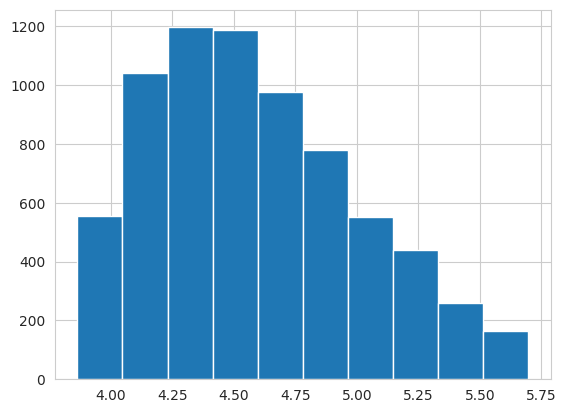

In [ ]:
# Possible consideration - logarithm transformation - can help to get better fit??
data['log_price'] = data.price.apply(np.log)
data['log2_price'] = data.log_price.apply(np.log)
data['log3_price'] = data.log2_price.apply(np.log)
data['log4_price'] = data.log3_price.apply(np.log)
data['log5_price'] = data.log4_price.apply(np.log)
data['sqrt_price'] = data.price.apply(np.sqrt)

data.log_price.hist()

# Kodowanie zmiennych kategorycznych do numerycznych
po to by móc zrobić SHAP

In [ ]:
# Zakoduj zmienne kategoryczne
X_encoded = data.copy()

# Konwertuj wszystkie boolean na int
bool_cols = X_encoded.select_dtypes(include='bool').columns
X_encoded[bool_cols] = X_encoded[bool_cols].astype(int)

# One-hot encoding dla zmiennych kategorycznych
categorical_cols = ['property_type_map', 'neighbourhood_cleansed_map']

for col in categorical_cols:
    if col in X_encoded.columns:
        dummies = pd.get_dummies(X_encoded[col], prefix=col, drop_first=True, dtype=int)
        # Zamień spacje na podkreślenia w nazwach dummy columns
        dummies.columns = dummies.columns.str.replace(' ', '_')
        X_encoded = pd.concat([X_encoded.drop(col, axis=1), dummies], axis=1)

# Zamień spacje na podkreślenia we wszystkich nazwach kolumn (na wszelki wypadek)
X_encoded.columns = X_encoded.columns.str.replace(' ', '_')

X_encoded.head(10)
data_encoded = X_encoded

In [ ]:
# get all numeric - just string creation
all_num_feats = [x for x in data_encoded.dtypes[data_encoded.dtypes != 'object'].index if not ('id' in x)
and not ('url' in x) and not ('price' in x)
and not ('longitude' in x) and not ('latitude' in x) ]

# print numerical features
print(" \n + ".join(all_num_feats))

accommodates 
 + bathrooms 
 + bedrooms 
 + beds 
 + minimum_nights 
 + maximum_nights 
 + minimum_minimum_nights 
 + maximum_minimum_nights 
 + minimum_maximum_nights 
 + maximum_maximum_nights 
 + minimum_nights_avg_ntm 
 + maximum_nights_avg_ntm 
 + availability_30 
 + availability_60 
 + availability_90 
 + availability_365 
 + availability_eoy 
 + estimated_occupancy_l365d 
 + estimated_revenue_l365d 
 + instant_bookable 
 + lat_dist_mean 
 + lon_dist_mean 
 + lat_dist_mean_sqrt 
 + lon_dist_mean_sqrt 
 + lat_dist_centre 
 + lon_dist_centre 
 + dist_from_center 
 + dist_from_center_sqrt 
 + dist_from_center_square 
 + bedrooms_sqrt 
 + bathrooms_sqrt 
 + accommodates_sqrt 
 + n_amenities 
 + is_fire_extinguisher 
 + is_shower_gel 
 + is_hot_water_kettle 
 + is_dishwasher 
 + is_dishes_and_silverware 
 + is_body_soap 
 + is_extra_pillows_and_blankets 
 + is_cooking_basics 
 + is_elevator 
 + is_microwave 
 + is_conditioner 
 + is_freezer 
 + is_cleaning_products 
 + is_self_check_i

# MODELLING
OLS - ordinary least squares - zwykła metoda najmniejszych kwadratów

In [ ]:
# Create copy of data
X = data.copy()
X.dropna()

X['log_price'] = X.price.apply(np.log)
X.head(3)

,id,listing_url,scrape_id,last_scraped,source,name,description,picture_url,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,availability_eoy,estimated_occupancy_l365d,estimated_revenue_l365d,instant_bookable,price_category,lat_dist_mean,lon_dist_mean,lat_dist_mean_sqrt,lon_dist_mean_sqrt,lat_dist_centre,lon_dist_centre,dist_from_center,dist_from_center_sqrt,dist_from_center_square,bedrooms_sqrt,bathrooms_sqrt,accommodates_sqrt,neighbourhood_cleansed_map,n_amenities,amenities_parsed,is_fire_extinguisher,is_shower_gel,is_hot_water_kettle,is_dishwasher,is_dishes_and_silverware,is_body_soap,is_extra_pillows_and_blankets,is_cooking_basics,is_elevator,is_microwave,is_conditioner,is_freezer,is_cleaning_products,is_self_check_in,is_coffee,is_free_washer___in_unit,is_carbon_monoxide_alarm,is_essentials,is_refrigerator,is_long_term_stays_allowed,is_luggage_dropoff_allowed,is_first_aid_kit,is_wine_glasses,is_coffee_maker,is_clothing_storage_closet,is_iron,is_dining_table,is_books_and_reading_material,is_bed_linens,is_hot_water,is_central_heating,is_smoke_alarm,is_paid_parking_off_premises,is_bathtub,is_hair_dryer,is_private_entrance,is_toaster,is_single_level_home,is_hangers,is_room_darkening_shades,is_wifi,is_drying_rack_for_clothing,is_shampoo,is_kitchen,is_ethernet_connection,is_heating,is_stove,is_washer,is_dryer,is_dedicated_workspace,is_host_greets_you,is_oven,is_pack_n_play_travel_crib,is_lockbox,is_pets_allowed,is_tv,is_clothing_storage,is_portable_fans,is_paid_street_parking_off_premises,is_high_chair,is_exterior_security_cameras_on_property,is_laundromat_nearby,is_outdoor_furniture,is_crib,is_mini_fridge,is_air_conditioning,is_paid_parking_on_premises,is_baking_sheet,is_private_patio_or_balcony,is_coffee_maker_nespresso,property_type_map,log_price,log2_price,log3_price,log4_price,log5_price,sqrt_price
2,26755,https://www.airbnb.com/rooms/26755,20250923203415,2025-09-24,city scrape,Central Prague Old Town Top Floor,Big and beautiful new attic apartment in the v...,https://a0.muscache.com/pictures/miso/Hosting-...,Praha 1,50.08729,14.43179,Entire rental unit,Entire home/apt,4,1.5,1.5 baths,1.0,2.0,"[""Fire extinguisher"", ""Shower gel"", ""Hot water...",93.3792,3,700,2.0,5.0,1125.0,1125.0,3.0,1125.0,t,1,11,25,142,2025-09-24,25,255,579360.0,0,Q3,0.000038,0.000003,0.006137,0.001676,3.551899e-08,0.000123,0.011106,0.105384,0.000123,1.0,1.224745,2.000000,Praha 1,58,"[Fire extinguisher, Shower gel, Hot water kett...",1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Entire rental unit,4.536669,1.512193,0.413561,-0.882951,NaN,9.663291
4,42514,https://www.airbnb.com/rooms/42514,20250923203415,2025-09-24,city scrape,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old ...",*NEWLY* Furnished 1-bedroom apartment on the f...,https://a0.muscache.com/pictures/7f66bc43-25c7...,Praha 1,50.08228,14.41345,Entire rental unit,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Fire extinguisher"", ""Dishes and silverware"",...",118.5735,7,365,7.0,7.0,365.0,365.0,7.0,365.0,t,27,57,87,362,2025-09-24,96,0,0.0,0,Q3,0.000001,0.000278,0.001127,0.016664,2.324720e-05,0.000052,0.008695,0.093248,0.000076,1.0,1.000000,1.732051,Praha 1,32,"[Fire extinguisher, Dishes and silverware, Ext...",1,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,1,1,1,1,1,0,0,1,0,1,0,0,1,1,0,1,1,0,1,1,0,0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Entire rental unit,4.775533,1.563506,0.446930,-0.805352,NaN,10.889146
5,52148,https://www.airbnb.com/rooms/52148,20250923203415,2025-09-24,city scrape,Colorful 2BDR Family Apartment,-The apartment has a self-check-

To use:
 + neighbourhood_cleansed_map
 + property_type_map

+ C(neighbourhood_cleansed_map,  Treatment(reference="other"))
+ C(property_type_map,  Treatment(reference="other"))

## 1 Model fit - simple

one-hot code encoding - C oznacza ze to kategoryczna

*zmienne   P>|t| > 0.2 na pewno do wywalenia*

Znaczenie zmiennych:
* **accommodates** - liczba osób którą pomieści

Brakuje zmiennej '**guests included**' ale chyba accommodates to jest to samo



In [ ]:
# Our first linear model
model = smf.ols(
    '''price ~ accommodates
                   + bathrooms
                   + bedrooms
                   + beds
                   + minimum_nights
                   + maximum_nights
                   + availability_30
                   + availability_60
                   + availability_90
                   + availability_365
                   + is_wifi
                   + is_tv
                   + is_essentials
                   + n_amenities
                   + lat_dist_mean
                   + lon_dist_mean
                   + dist_from_center
                   + neighbourhood_cleansed_map
                   + property_type_map
    ''',
    data=data).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.445
Model:                            OLS   Adj. R-squared:                  0.441
Method:                 Least Squares   F-statistic:                     132.3
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:42:52   Log-Likelihood:                -36035.
No. Observations:                7151   AIC:                         7.216e+04
Df Residuals:                    7107   BIC:                         7.246e+04
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

### RMSE

In [ ]:
'''RMSE wciąż lewa strona jest bardziej skośna robimy logarytm z ceny
'''
np.sqrt(model.mse_resid)

np.float64(37.4599301248953)

In [ ]:
# Calculate residuals
residuals = data['price'] - (model.predict(model.model.data.frame))

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(37.34450709662932)

In [ ]:
import plotly.express as px
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.925
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 3933.067
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



## 2 Model fit - all

In [ ]:
# Our second linear model
model = smf.ols(
    '''price ~  accommodates
 + bathrooms
 + bedrooms
 + beds
 + minimum_nights
 + maximum_nights
 + minimum_minimum_nights
 + maximum_minimum_nights
 + minimum_maximum_nights
 + maximum_maximum_nights
 + minimum_nights_avg_ntm
 + maximum_nights_avg_ntm
 + availability_30
 + availability_60
 + availability_90
 + availability_365
 + availability_eoy
 + estimated_occupancy_l365d
 + estimated_revenue_l365d
 + instant_bookable
 + lat_dist_mean
 + lon_dist_mean
 + dist_from_center
 + n_amenities
 + is_fire_extinguisher
 + is_shower_gel
 + is_hot_water_kettle
 + is_dishwasher
 + is_dishes_and_silverware
 + is_body_soap
 + is_extra_pillows_and_blankets
 + is_cooking_basics
 + is_elevator
 + is_microwave
 + is_conditioner
 + is_freezer
 + is_cleaning_products
 + is_self_check_in
 + is_coffee
 + is_free_washer___in_unit
 + is_essentials
 + is_refrigerator
 + is_long_term_stays_allowed
 + is_luggage_dropoff_allowed
 + is_wine_glasses
 + is_coffee_maker
 + is_clothing_storage_closet
 + is_iron
 + is_dining_table
 + is_books_and_reading_material
 + is_bed_linens
 + is_hot_water
 + is_central_heating
 + is_smoke_alarm
 + is_bathtub
 + is_hair_dryer
 + is_private_entrance
 + is_toaster
 + is_single_level_home
 + is_hangers
 + is_room_darkening_shades
 + is_wifi
 + is_drying_rack_for_clothing
 + is_shampoo
 + is_kitchen
 + is_ethernet_connection
 + is_heating
 + is_stove
 + is_washer
 + is_dryer
 + is_dedicated_workspace
 + is_host_greets_you
 + is_oven
 + is_pack_n_play_travel_crib
 + is_lockbox
 + is_pets_allowed
 + is_tv
 + is_clothing_storage
 + is_portable_fans
 + is_high_chair
 + is_exterior_security_cameras_on_property
 + is_laundromat_nearby
 + is_outdoor_furniture
 + is_crib
 + is_air_conditioning
 + is_baking_sheet
 + is_private_patio_or_balcony
 + is_coffee_maker_nespresso
                   + neighbourhood_cleansed_map
                   + property_type_map
    ''',
    data=data).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.681
Model:                            OLS   Adj. R-squared:                  0.676
Method:                 Least Squares   F-statistic:                     131.7
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:42:57   Log-Likelihood:                -34054.
No. Observations:                7151   AIC:                         6.834e+04
Df Residuals:                    7036   BIC:                         6.913e+04
Df Model:                         114                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

## Predykcje

In [ ]:
result = pd.concat([data.price, model.predict(data).rename('predict')], axis=1)
# Obliczanie i wyświetlanie % wartości NaN w kolumnie 'predict'
print(f"Percent of NaN: {(result['predict'].isna().sum() / len(result)) * 100:.2f}%")
result.head(10)

Percent of NaN: 0.00%


,price,predict
2,93.3792,95.432806
4,118.5735,120.612085
5,102.6267,85.488120
6,84.4605,61.331771
7,64.5681,106.729694
12,121.6971,105.543415
13,131.3967,117.210357
14,136.6575,123.831170
15,158.7282,169.394954
17,60.2526,33.714843


### RMSE

In [ ]:
# Calculate residuals
residuals = data['price'] - (model.predict(model.model.data.frame))

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(28.3082816508432)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.903
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 9829.073
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



## Eksport parametrów modelu liniowego

In [ ]:
# Eksport parametrów nachylenia
model.params.round(4).to_excel('params.xlsx')
# Eksport p-values i innych istotnych parametrów
results_summary = pd.DataFrame({
    'coefficient': model.params,
    'std_err': model.bse,
    't_value': model.tvalues,
    'p_value': model.pvalues,
    'conf_lower': model.conf_int()[0],
    'conf_upper': model.conf_int()[1]
})

results_summary.round(4).to_excel('model_results_linear.xlsx')

## 3 Model fit - log_price & simple

In [ ]:
# Our first linear model
model = smf.ols(
    '''log_price ~ accommodates
                   + bathrooms
                   + bedrooms
                   + beds
                   + minimum_nights
                   + maximum_nights
                   + availability_30
                   + availability_60
                   + availability_90
                   + availability_365
                   + is_wifi
                   + is_tv
                   + is_essentials
                   + n_amenities
                   + lat_dist_mean
                   + lon_dist_mean
                   + dist_from_center
                   + neighbourhood_cleansed_map
                   + property_type_map
    ''',
    data=data).fit()
# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.454
Model:                            OLS   Adj. R-squared:                  0.451
Method:                 Least Squares   F-statistic:                     137.6
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:42:58   Log-Likelihood:                -1726.8
No. Observations:                7151   AIC:                             3542.
Df Residuals:                    7107   BIC:                             3844.
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

### RMSE

In [ ]:
# Calculate residuals
residuals = data['price'] - np.exp(model.predict(model.model.data.frame))

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(38.35827625671822)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.904
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 399.854
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



## 4 Model fit - log_price & all

In [ ]:
# Our first linear model
model = smf.ols(
    '''log_price ~ accommodates
 + bathrooms
 + bedrooms
 + beds
 + minimum_nights
 + maximum_nights
 + minimum_minimum_nights
 + maximum_minimum_nights
 + minimum_maximum_nights
 + maximum_maximum_nights
 + minimum_nights_avg_ntm
 + maximum_nights_avg_ntm
 + availability_30
 + availability_60
 + availability_90
 + availability_365
 + availability_eoy
 + estimated_occupancy_l365d
 + estimated_revenue_l365d
 + instant_bookable
 + lat_dist_mean
 + lon_dist_mean
 + dist_from_center
 + n_amenities
 + is_fire_extinguisher
 + is_shower_gel
 + is_hot_water_kettle
 + is_dishwasher
 + is_dishes_and_silverware
 + is_body_soap
 + is_extra_pillows_and_blankets
 + is_cooking_basics
 + is_elevator
 + is_microwave
 + is_conditioner
 + is_freezer
 + is_cleaning_products
 + is_self_check_in
 + is_coffee
 + is_free_washer___in_unit
 + is_essentials
 + is_refrigerator
 + is_long_term_stays_allowed
 + is_luggage_dropoff_allowed
 + is_wine_glasses
 + is_coffee_maker
 + is_clothing_storage_closet
 + is_iron
 + is_dining_table
 + is_books_and_reading_material
 + is_bed_linens
 + is_hot_water
 + is_central_heating
 + is_smoke_alarm
 + is_bathtub
 + is_hair_dryer
 + is_private_entrance
 + is_toaster
 + is_single_level_home
 + is_hangers
 + is_room_darkening_shades
 + is_wifi
 + is_drying_rack_for_clothing
 + is_shampoo
 + is_kitchen
 + is_ethernet_connection
 + is_heating
 + is_stove
 + is_washer
 + is_dryer
 + is_dedicated_workspace
 + is_host_greets_you
 + is_oven
 + is_pack_n_play_travel_crib
 + is_lockbox
 + is_pets_allowed
 + is_tv
 + is_clothing_storage
 + is_portable_fans
 + is_high_chair
 + is_exterior_security_cameras_on_property
 + is_laundromat_nearby
 + is_outdoor_furniture
 + is_crib
 + is_air_conditioning
 + is_baking_sheet
 + is_private_patio_or_balcony
 + is_coffee_maker_nespresso
                   + neighbourhood_cleansed_map
                   + property_type_map
    ''',
    data=data).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.702
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     145.1
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:42:59   Log-Likelihood:                 431.99
No. Observations:                7151   AIC:                            -634.0
Df Residuals:                    7036   BIC:                             156.7
Df Model:                         114                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

### RMSE

In [ ]:
# Calculate residuals
residuals = data['price'] - np.exp(model.predict(model.model.data.frame))

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(31.927532462467692)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.841
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 765.656
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



RMSE może być wyższe, ale ważne żeby rezydua spełniały założenia modelu liniowego, więc teraz jest lepiej jeśli testy liniowości będą spełnione.

Ten model jest bardziej przydatny predykcyjnie.

## 5 Model - log_price & all - export
Powinien dać to samo co model 4, ale:
* sprawdzenie rzutowania
* wygodniejszy do exportu
* mapowanie do SHAP-values

In [ ]:
# Our first linear model
model = smf.ols(
    '''log_price ~ accommodates
 + bathrooms
 + bedrooms
 + beds
 + minimum_nights
 + maximum_nights
 + minimum_minimum_nights
 + maximum_minimum_nights
 + minimum_maximum_nights
 + maximum_maximum_nights
 + minimum_nights_avg_ntm
 + maximum_nights_avg_ntm
 + availability_30
 + availability_60
 + availability_90
 + availability_365
 + availability_eoy
 + estimated_occupancy_l365d
 + estimated_revenue_l365d
 + instant_bookable
 + lat_dist_mean
 + lon_dist_mean
 + dist_from_center
 + n_amenities
 + is_fire_extinguisher
 + is_shower_gel
 + is_hot_water_kettle
 + is_dishwasher
 + is_dishes_and_silverware
 + is_body_soap
 + is_extra_pillows_and_blankets
 + is_cooking_basics
 + is_elevator
 + is_microwave
 + is_conditioner
 + is_freezer
 + is_cleaning_products
 + is_self_check_in
 + is_coffee
 + is_free_washer___in_unit
 + is_essentials
 + is_refrigerator
 + is_long_term_stays_allowed
 + is_luggage_dropoff_allowed
 + is_wine_glasses
 + is_coffee_maker
 + is_clothing_storage_closet
 + is_iron
 + is_dining_table
 + is_books_and_reading_material
 + is_bed_linens
 + is_hot_water
 + is_central_heating
 + is_smoke_alarm
 + is_bathtub
 + is_hair_dryer
 + is_private_entrance
 + is_toaster
 + is_single_level_home
 + is_hangers
 + is_room_darkening_shades
 + is_wifi
 + is_drying_rack_for_clothing
 + is_shampoo
 + is_kitchen
 + is_ethernet_connection
 + is_heating
 + is_stove
 + is_washer
 + is_dryer
 + is_dedicated_workspace
 + is_host_greets_you
 + is_oven
 + is_pack_n_play_travel_crib
 + is_lockbox
 + is_pets_allowed
 + is_tv
 + is_clothing_storage
 + is_portable_fans
 + is_high_chair
 + is_exterior_security_cameras_on_property
 + is_laundromat_nearby
 + is_outdoor_furniture
 + is_crib
 + is_air_conditioning
 + is_baking_sheet
 + is_private_patio_or_balcony
 + is_coffee_maker_nespresso
 + property_type_map_Entire_guest_suite
 + property_type_map_Entire_home
 + property_type_map_Entire_loft
 + property_type_map_Entire_rental_unit
 + property_type_map_Entire_serviced_apartment
 + property_type_map_other
 + neighbourhood_cleansed_map_Praha_1
 + neighbourhood_cleansed_map_Praha_10
 + neighbourhood_cleansed_map_Praha_11
 + neighbourhood_cleansed_map_Praha_12
 + neighbourhood_cleansed_map_Praha_13
 + neighbourhood_cleansed_map_Praha_14
 + neighbourhood_cleansed_map_Praha_15
 + neighbourhood_cleansed_map_Praha_18
 + neighbourhood_cleansed_map_Praha_2
 + neighbourhood_cleansed_map_Praha_3
 + neighbourhood_cleansed_map_Praha_4
 + neighbourhood_cleansed_map_Praha_5
 + neighbourhood_cleansed_map_Praha_6
 + neighbourhood_cleansed_map_Praha_7
 + neighbourhood_cleansed_map_Praha_8
 + neighbourhood_cleansed_map_Praha_9
 + neighbourhood_cleansed_map_Velká_Chuchle
 + neighbourhood_cleansed_map_Zbraslav
 + neighbourhood_cleansed_map_Zličín
 + neighbourhood_cleansed_map_other
    ''',
    data=data_encoded).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.702
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     145.1
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:43:00   Log-Likelihood:                 431.99
No. Observations:                7151   AIC:                            -634.0
Df Residuals:                    7036   BIC:                             156.7
Df Model:                         114                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

### RMSE

In [ ]:
# Calculate residuals
residuals = data['price'] - np.exp(model.predict(model.model.data.frame))

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(31.92753246629773)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.841
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 765.656
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



## Eksport parametrów modelu liniowego

In [ ]:
# Eksport parametrów nachylenia
model.params.round(4).to_excel('params.xlsx')
# Eksport p-values i innych istotnych parametrów
results_summary = pd.DataFrame({
    'coefficient': model.params,
    'std_err': model.bse,
    't_value': model.tvalues,
    'p_value': model.pvalues,
    'conf_lower': model.conf_int()[0],
    'conf_upper': model.conf_int()[1]
})

results_summary.round(4).to_excel('model_results_log.xlsx')

## 6 Model - log_price & istotne (p>0.05)

In [ ]:
# Our first linear model
model = smf.ols(
    '''log_price ~  lon_dist_mean
+ lat_dist_mean
+ accommodates
+ neighbourhood_cleansed_map_Praha_4
+ neighbourhood_cleansed_map_Praha_8
+ neighbourhood_cleansed_map_Praha_11
+ neighbourhood_cleansed_map_other
+ neighbourhood_cleansed_map_Velká_Chuchle
+ neighbourhood_cleansed_map_Praha_9
+ neighbourhood_cleansed_map_Praha_1
+ property_type_map_other
+ bedrooms
+ property_type_map_Entire_home
+ bathrooms
+ is_dishwasher
+ is_hot_water
+ is_essentials
+ is_cooking_basics
+ is_hair_dryer
+ is_self_check_in
+ dist_from_center
+ is_hot_water_kettle
+ is_coffee_maker_nespresso
+ is_books_and_reading_material
+ is_single_level_home
+ is_cleaning_products
+ is_coffee
+ is_long_term_stays_allowed
+ is_bed_linens
+ is_microwave
+ is_pack_n_play_travel_crib
+ is_drying_rack_for_clothing
+ is_crib
+ is_wine_glasses
+ is_bathtub
+ is_extra_pillows_and_blankets
+ is_dining_table
+ is_private_entrance
+ minimum_nights
+ availability_30
+ availability_90
+ is_air_conditioning
+ property_type_map_Entire_guest_suite
+ property_type_map_Entire_rental_unit
+ maximum_minimum_nights
+ neighbourhood_cleansed_map_Praha_12
+ neighbourhood_cleansed_map_Praha_13
+ neighbourhood_cleansed_map_Praha_15
+ availability_365
+ neighbourhood_cleansed_map_Praha_7
    ''',
    data=data_encoded).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.481
Model:                            OLS   Adj. R-squared:                  0.477
Method:                 Least Squares   F-statistic:                     131.6
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:43:00   Log-Likelihood:                -1547.4
No. Observations:                7151   AIC:                             3197.
Df Residuals:                    7100   BIC:                             3547.
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

### RMSE

In [ ]:
# Calculate residuals
residuals = data['price'] - np.exp(model.predict(model.model.data.frame))

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(37.386535937547)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.909
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 360.379
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



## 6.2 Model - log_price & istotne (t>5.0)

In [ ]:
# Our first linear model
model = smf.ols(
    '''log4_price ~  bedrooms
+ minimum_nights
+ minimum_nights_avg_ntm
+ availability_30
+ is_air_conditioning
+ accommodates
+ property_type_map_Entire_serviced_apartment
+ is_dishwasher
+ dist_from_center
+ is_tv
+ bathrooms
+ n_amenities
+ maximum_minimum_nights
+ is_dishes_and_silverware
+ property_type_map_other
+ lon_dist_mean
    ''',
    data=data_encoded).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             log4_price   R-squared:                       0.447
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     360.9
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:43:00   Log-Likelihood:                 5985.6
No. Observations:                7151   AIC:                        -1.194e+04
Df Residuals:                    7134   BIC:                        -1.182e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

### RMSE

In [ ]:
# Calculate residuals
predictionss = model.predict(model.model.data.frame)
for i in range(4):
  predictions_tmp = np.exp(predictionss)
  predictionss = predictions_tmp

residuals = data['price'] - predictionss

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(46.21444165089973)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.740
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 4.133
Wartość p: 0.127
Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



In [ ]:
data_encoded.head(1)

,id,listing_url,scrape_id,last_scraped,source,name,description,picture_url,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,availability_eoy,estimated_occupancy_l365d,estimated_revenue_l365d,instant_bookable,price_category,lat_dist_mean,lon_dist_mean,lat_dist_mean_sqrt,lon_dist_mean_sqrt,lat_dist_centre,lon_dist_centre,dist_from_center,dist_from_center_sqrt,dist_from_center_square,bedrooms_sqrt,bathrooms_sqrt,accommodates_sqrt,n_amenities,amenities_parsed,is_fire_extinguisher,is_shower_gel,is_hot_water_kettle,is_dishwasher,is_dishes_and_silverware,is_body_soap,is_extra_pillows_and_blankets,is_cooking_basics,is_elevator,is_microwave,is_conditioner,is_freezer,is_cleaning_products,is_self_check_in,is_coffee,is_free_washer___in_unit,is_carbon_monoxide_alarm,is_essentials,is_refrigerator,is_long_term_stays_allowed,is_luggage_dropoff_allowed,is_first_aid_kit,is_wine_glasses,is_coffee_maker,is_clothing_storage_closet,is_iron,is_dining_table,is_books_and_reading_material,is_bed_linens,is_hot_water,is_central_heating,is_smoke_alarm,is_paid_parking_off_premises,is_bathtub,is_hair_dryer,is_private_entrance,is_toaster,is_single_level_home,is_hangers,is_room_darkening_shades,is_wifi,is_drying_rack_for_clothing,is_shampoo,is_kitchen,is_ethernet_connection,is_heating,is_stove,is_washer,is_dryer,is_dedicated_workspace,is_host_greets_you,is_oven,is_pack_n_play_travel_crib,is_lockbox,is_pets_allowed,is_tv,is_clothing_storage,is_portable_fans,is_paid_street_parking_off_premises,is_high_chair,is_exterior_security_cameras_on_property,is_laundromat_nearby,is_outdoor_furniture,is_crib,is_mini_fridge,is_air_conditioning,is_paid_parking_on_premises,is_baking_sheet,is_private_patio_or_balcony,is_coffee_maker_nespresso,log_price,log2_price,log3_price,log4_price,log5_price,sqrt_price,property_type_map_Entire_guest_suite,property_type_map_Entire_home,property_type_map_Entire_loft,property_type_map_Entire_rental_unit,property_type_map_Entire_serviced_apartment,property_type_map_other,neighbourhood_cleansed_map_Praha_1,neighbourhood_cleansed_map_Praha_10,neighbourhood_cleansed_map_Praha_11,neighbourhood_cleansed_map_Praha_12,neighbourhood_cleansed_map_Praha_13,neighbourhood_cleansed_map_Praha_14,neighbourhood_cleansed_map_Praha_15,neighbourhood_cleansed_map_Praha_18,neighbourhood_cleansed_map_Praha_2,neighbourhood_cleansed_map_Praha_3,neighbourhood_cleansed_map_Praha_4,neighbourhood_cleansed_map_Praha_5,neighbourhood_cleansed_map_Praha_6,neighbourhood_cleansed_map_Praha_7,neighbourhood_cleansed_map_Praha_8,neighbourhood_cleansed_map_Praha_9,neighbourhood_cleansed_map_Velká_Chuchle,neighbourhood_cleansed_map_Zbraslav,neighbourhood_cleansed_map_Zličín,neighbourhood_cleansed_map_other
2,26755,https://www.airbnb.com/rooms/26755,20250923203415,2025-09-24,city scrape,Central Prague Old Town Top Floor,Big and beautiful new attic apartment in the v...,https://a0.muscache.com/pictures/miso/Hosting-...,Praha 1,50.08729,14.43179,Entire rental unit,Entire home/apt,4,1.5,1.5 baths,1.0,2.0,"[""Fire extinguisher"", ""Shower gel"", ""Hot water...",93.3792,3,700,2.0,5.0,1125.0,1125.0,3.0,1125.0,t,1,11,25,142,2025-09-24,25,255,579360.0,0,Q3,0.000038,0.000003,0.006137,0.001676,3.551899e-08,0.000123,0.011106,0.105384,0.000123,1.0,1.224745,2.0,58,"[Fire extinguisher, Shower gel, Hot water kett...",1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.536669,1.512193,0.413561,-0.882951,NaN,9.663291,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## 6.3 Model - log_price & istotne (t>5.0)

In [ ]:
# Our first linear model
model = smf.ols(
    '''log4_price ~  estimated_occupancy_l365d
+ bedrooms
+ minimum_nights
+ minimum_nights_avg_ntm
+ availability_30
+ is_air_conditioning
+ accommodates
+ property_type_map_Entire_serviced_apartment
+ is_dishwasher
+ dist_from_center
+ is_tv
+ bathrooms
+ n_amenities
+ maximum_minimum_nights
+ is_dishes_and_silverware
+ property_type_map_other
+ lon_dist_mean
    ''',
    data=data_encoded).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             log4_price   R-squared:                       0.472
Model:                            OLS   Adj. R-squared:                  0.471
Method:                 Least Squares   F-statistic:                     374.9
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:43:01   Log-Likelihood:                 6147.6
No. Observations:                7151   AIC:                        -1.226e+04
Df Residuals:                    7133   BIC:                        -1.214e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

### RMSE

In [ ]:
# Calculate residuals
predictions = model.predict(model.model.data.frame)
for i in range(4):
  predictions_tmp = np.exp(predictions)
  predictions = predictions_tmp

residuals = data['price'] - predictions

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(45.96305392928992)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.747
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 3.695
Wartość p: 0.158
Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



# Skewness & Kurtosis test

📊 Box-Cox optymalny parametr lambda: -0.5532

Original - Kolmogorov-Smirnov p-value: 0.0000
Original - Skewness: 1.3548
Original - Kurtosis: 1.5501

Log - Kolmogorov-Smirnov p-value: 0.0000
Log - Skewness: 0.4884
Log - Kurtosis: -0.4776

Log4 - Kolmogorov-Smirnov p-value: 0.0000
Log4 - Skewness: -0.0491
Log4 - Kurtosis: -0.7588

Sqrt_log - Kolmogorov-Smirnov p-value: 0.0000
Sqrt_log - Skewness: 0.4034
Sqrt_log - Kurtosis: -0.5741

Sqrt_log3 - Kolmogorov-Smirnov p-value: 0.0000
Sqrt_log3 - Skewness: 0.0813
Sqrt_log3 - Kurtosis: -0.7622

Box-Cox - Kolmogorov-Smirnov p-value: 0.0000
Box-Cox - Skewness: 0.0638
Box-Cox - Kurtosis: -0.8032



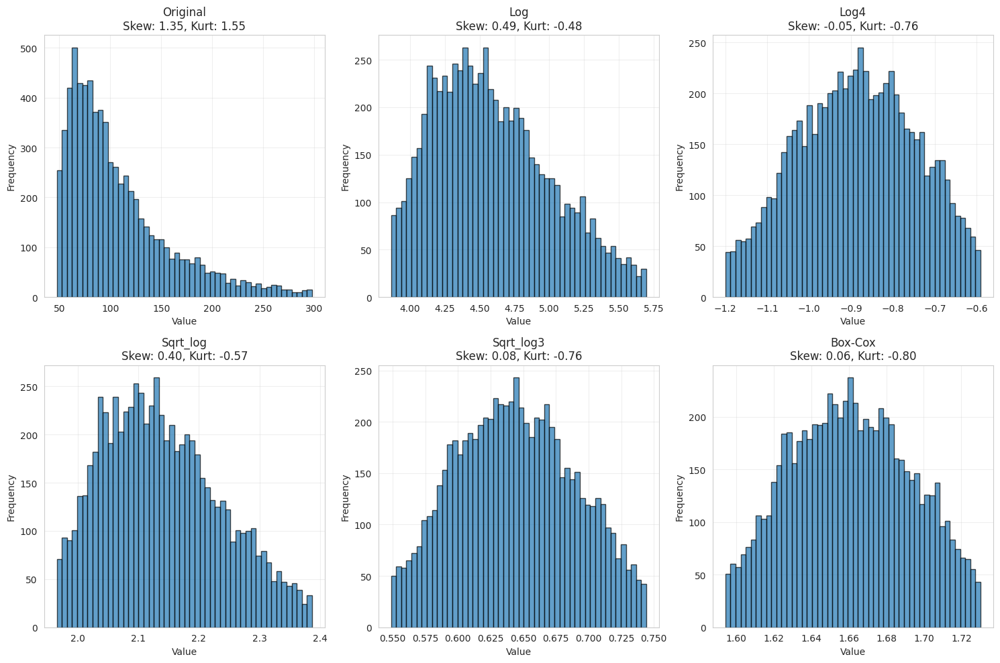


PODSUMOWANIE:
Original        | Skew:  1.355 | Kurt:  1.550
Log             | Skew:  0.488 | Kurt: -0.478
Log4            | Skew: -0.049 | Kurt: -0.759
Sqrt_log        | Skew:  0.403 | Kurt: -0.574
Sqrt_log3       | Skew:  0.081 | Kurt: -0.762
Box-Cox         | Skew:  0.064 | Kurt: -0.803


In [ ]:
from scipy import stats
from scipy.stats import boxcox
import matplotlib.pyplot as plt
import numpy as np

def test_normality(data, name):
    """Test normalności rozkładu"""
    # Test Shapiro-Wilka (dla n < 5000)
    if len(data) < 5000:
        stat, p_value = stats.shapiro(data)
        print(f"{name} - Shapiro-Wilk p-value: {p_value:.4f}")

    # Test Kołmogorowa-Smirnowa
    stat, p_value = stats.kstest(data, 'norm')
    print(f"{name} - Kolmogorov-Smirnov p-value: {p_value:.4f}")

    # Skewness i Kurtosis
    print(f"{name} - Skewness: {stats.skew(data):.4f}")
    print(f"{name} - Kurtosis: {stats.kurtosis(data):.4f}")
    print()

# Przygotuj dane (usuń wartości <= 0 dla Box-Cox)
y=data['price']
y_positive = y[y > 0]

# Box-Cox transformacja
y_boxcox, lambda_param = boxcox(y_positive)
print(f"📊 Box-Cox optymalny parametr lambda: {lambda_param:.4f}\n")

# Testuj różne transformacje
transformations = {
    'Original': y,
    'Log': np.log(y_positive),
    'Log4': np.log(np.log(np.log(np.log(y_positive)))),
    # 'Log1p': np.log1p(y),
    # 'Sqrt': np.sqrt(y[y >= 0]),
    'Sqrt_log': np.sqrt(np.log(y_positive)),
    # 'Sqrt_log_log': np.sqrt(np.log(np.log(y_positive))),
    'Sqrt_log3': np.sqrt(np.log(np.log(np.log(y_positive)))),
    # 'Sqrt_log4': np.sqrt(np.log(np.log(np.log(np.log(y_positive))))),
    'Box-Cox': y_boxcox,
}

for name, dataa in transformations.items():
    test_normality(dataa, name)

# Wizualizacja
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, (name, dataa) in enumerate(transformations.items()):
    axes[i].hist(dataa, bins=50, edgecolor='black', alpha=0.7)
    axes[i].set_title(f'{name}\nSkew: {stats.skew(dataa):.2f}, Kurt: {stats.kurtosis(dataa):.2f}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')
    axes[i].grid(True, alpha=0.3)

# Usuń pusty subplot
if len(transformations) < len(axes):
    fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()

# Podsumowanie
print("\n" + "="*60)
print("PODSUMOWANIE:")
print("="*60)
for name, dataa in transformations.items():
    print(f"{name:15} | Skew: {stats.skew(dataa):6.3f} | Kurt: {stats.kurtosis(dataa):6.3f}")

## 7 Model - box_cox & all

In [ ]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox

# Przygotuj dane - transformacja Box-Cox
y_positive = data_encoded['price'][data_encoded['price'] > 0]
data_boxcox = data_encoded[data_encoded['price'] > 0].copy()

# Oblicz Box-Cox transformację
y_boxcox, lambda_param = boxcox(y_positive)
data_boxcox['price_boxcox'] = y_boxcox

print(f"📊 Box-Cox optymalny parametr lambda: {lambda_param:.4f}\n")

# Model z transformacją Box-Cox
model = smf.ols(
    '''price_boxcox ~ accommodates
 + bathrooms
 + bedrooms
 + beds
 + minimum_nights
 + maximum_nights
 + minimum_minimum_nights
 + maximum_minimum_nights
 + minimum_maximum_nights
 + maximum_maximum_nights
 + minimum_nights_avg_ntm
 + maximum_nights_avg_ntm
 + availability_30
 + availability_60
 + availability_90
 + availability_365
 + availability_eoy
 + estimated_occupancy_l365d
 + estimated_revenue_l365d
 + instant_bookable
 + lat_dist_mean
 + lon_dist_mean
 + dist_from_center
 + n_amenities
 + is_fire_extinguisher
 + is_shower_gel
 + is_hot_water_kettle
 + is_dishwasher
 + is_dishes_and_silverware
 + is_body_soap
 + is_extra_pillows_and_blankets
 + is_cooking_basics
 + is_elevator
 + is_microwave
 + is_conditioner
 + is_freezer
 + is_cleaning_products
 + is_self_check_in
 + is_coffee
 + is_free_washer___in_unit
 + is_essentials
 + is_refrigerator
 + is_long_term_stays_allowed
 + is_luggage_dropoff_allowed
 + is_wine_glasses
 + is_coffee_maker
 + is_clothing_storage_closet
 + is_iron
 + is_dining_table
 + is_books_and_reading_material
 + is_bed_linens
 + is_hot_water
 + is_central_heating
 + is_smoke_alarm
 + is_bathtub
 + is_hair_dryer
 + is_private_entrance
 + is_toaster
 + is_single_level_home
 + is_hangers
 + is_room_darkening_shades
 + is_wifi
 + is_drying_rack_for_clothing
 + is_shampoo
 + is_kitchen
 + is_ethernet_connection
 + is_heating
 + is_stove
 + is_washer
 + is_dryer
 + is_dedicated_workspace
 + is_host_greets_you
 + is_oven
 + is_pack_n_play_travel_crib
 + is_lockbox
 + is_pets_allowed
 + is_tv
 + is_clothing_storage
 + is_portable_fans
 + is_high_chair
 + is_exterior_security_cameras_on_property
 + is_laundromat_nearby
 + is_outdoor_furniture
 + is_crib
 + is_air_conditioning
 + is_baking_sheet
 + is_private_patio_or_balcony
 + is_coffee_maker_nespresso
 + property_type_map_Entire_guest_suite
 + property_type_map_Entire_home
 + property_type_map_Entire_loft
 + property_type_map_Entire_rental_unit
 + property_type_map_Entire_serviced_apartment
 + property_type_map_other
 + neighbourhood_cleansed_map_Praha_1
 + neighbourhood_cleansed_map_Praha_10
 + neighbourhood_cleansed_map_Praha_11
 + neighbourhood_cleansed_map_Praha_12
 + neighbourhood_cleansed_map_Praha_13
 + neighbourhood_cleansed_map_Praha_14
 + neighbourhood_cleansed_map_Praha_15
 + neighbourhood_cleansed_map_Praha_18
 + neighbourhood_cleansed_map_Praha_2
 + neighbourhood_cleansed_map_Praha_3
 + neighbourhood_cleansed_map_Praha_4
 + neighbourhood_cleansed_map_Praha_5
 + neighbourhood_cleansed_map_Praha_6
 + neighbourhood_cleansed_map_Praha_7
 + neighbourhood_cleansed_map_Praha_8
 + neighbourhood_cleansed_map_Praha_9
 + neighbourhood_cleansed_map_Velká_Chuchle
 + neighbourhood_cleansed_map_Zbraslav
 + neighbourhood_cleansed_map_Zličín
 + neighbourhood_cleansed_map_other
    ''',
    data=data_boxcox).fit()

# Wyświetl wyniki
print(model.summary())

# WAŻNE: Zapisz lambda_param do późniejszego odwrócenia predykcji
print(f"\n💾 Zapisz lambda_param = {lambda_param:.4f} do odwrócenia predykcji!")

# Przykład odwrócenia predykcji:
# predictions_boxcox = model.predict(X)
# predictions_original = inv_boxcox(predictions_boxcox, lambda_param)

📊 Box-Cox optymalny parametr lambda: -0.5532

                            OLS Regression Results                            
Dep. Variable:           price_boxcox   R-squared:                       0.685
Model:                            OLS   Adj. R-squared:                  0.680
Method:                 Least Squares   F-statistic:                     134.0
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:43:03   Log-Likelihood:                 18588.
No. Observations:                7151   AIC:                        -3.695e+04
Df Residuals:                    7036   BIC:                        -3.616e+04
Df Model:                         114                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------

In [ ]:
from scipy.special import inv_boxcox

# Calculate predictions w skali Box-Cox
predictions_boxcox = model.predict(model.model.data.frame)

# Odwróć transformację Box-Cox do oryginalnej skali
predictions_original = inv_boxcox(predictions_boxcox, lambda_param)

# Calculate residuals w oryginalnej skali cen
residuals = data_boxcox['price'] - predictions_original

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
print(f"RMSE: {rmse:.2f}")

# Opcjonalnie - inne metryki - MAE = mean absolute error
mae = np.mean(np.abs(residuals))
print(f"MAE: {mae:.2f}")

# Residuals w skali Box-Cox (dla diagnostyki modelu)
residuals_boxcox = data_boxcox['price_boxcox'] - predictions_boxcox

RMSE: 174.81
MAE: 27.77


### RMSE

In [ ]:
# Calculate residuals
residuals = data_boxcox['price'] - inv_boxcox(predictions_boxcox, lambda_param)

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(174.81359228960477)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.093
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 184.718
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



## Eksport parametrów modelu liniowego

In [ ]:
# Eksport parametrów nachylenia
model.params.round(4).to_excel('params.xlsx')
# Eksport p-values i innych istotnych parametrów
results_summary = pd.DataFrame({
    'coefficient': model.params,
    'std_err': model.bse,
    't_value': model.tvalues,
    'p_value': model.pvalues,
    'conf_lower': model.conf_int()[0],
    'conf_upper': model.conf_int()[1]
})

results_summary.round(4).to_excel('model_results_boxcox.xlsx')

## 8 Model - box_cox & redukcja

In [ ]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox

# Przygotuj dane - transformacja Box-Cox
y_positive = data_encoded['price'][data_encoded['price'] > 0]
data_boxcox = data_encoded[data_encoded['price'] > 0].copy()

# Oblicz Box-Cox transformację
y_boxcox, lambda_param = boxcox(y_positive)
data_boxcox['price_boxcox'] = y_boxcox
data['price_boxcox'] = y_boxcox

print(f"📊 Box-Cox optymalny parametr lambda: {lambda_param:.4f}\n")

# Model z transformacją Box-Cox
model = smf.ols(
    '''price_boxcox ~ bedrooms
+ minimum_nights
+ minimum_nights_avg_ntm
+ availability_30
+ is_air_conditioning
+ accommodates
+ property_type_map_Entire_serviced_apartment
+ is_dishwasher
+ dist_from_center
+ is_tv
+ bathrooms
+ n_amenities
+ maximum_minimum_nights
+ is_dishes_and_silverware
+ property_type_map_other
+ lon_dist_mean
    ''',
    data=data_boxcox).fit()

# Wyświetl wyniki
print(model.summary())

# WAŻNE: Zapisz lambda_param do późniejszego odwrócenia predykcji
print(f"\n💾 Zapisz lambda_param = {lambda_param:.4f} do odwrócenia predykcji!")

# Przykład odwrócenia predykcji:
# predictions_boxcox = model.predict(X)
# predictions_original = inv_boxcox(predictions_boxcox, lambda_param)

📊 Box-Cox optymalny parametr lambda: -0.5532

                            OLS Regression Results                            
Dep. Variable:           price_boxcox   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     369.6
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:43:04   Log-Likelihood:                 16620.
No. Observations:                7151   AIC:                        -3.321e+04
Df Residuals:                    7134   BIC:                        -3.309e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------

### RMSE

In [ ]:
from scipy.special import inv_boxcox

# Calculate predictions w skali Box-Cox
predictions_boxcox = model.predict(model.model.data.frame)

# Calculate residuals
residuals = data_boxcox['price'] - inv_boxcox(predictions_boxcox, lambda_param)

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(49.771455642461504)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.636
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 23.061
Wartość p: 0.000
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



# FINAL 6.3 Model - log4_price & istotne (t>5.0) & ręcznie dodane

In [ ]:
# MODEL ZE ZMIENNYMI KWADRATOWYMI
#  estimated_occupancy_l365d
#+ availability_30
#+ is_hot_water_kettle
#+ neighbourhood_cleansed_map_Praha_4
# dist_from_center_sqrt
# bedrooms_sqrt
# minimum_nights_avg_ntm
# maximum_minimum_nights
model = smf.ols(
    '''log4_price ~  bedrooms_sqrt
+ accommodates_sqrt
+ bathrooms_sqrt
+ dist_from_center
+ lon_dist_mean
+ lat_dist_mean
+ minimum_nights
+ property_type_map_Entire_serviced_apartment
+ property_type_map_Entire_rental_unit
+ property_type_map_other
+ instant_bookable
+ n_amenities
+ is_air_conditioning
+ is_dishwasher
+ is_tv
+ is_dishes_and_silverware
+ is_essentials
+ is_self_check_in
+ is_microwave
+ is_coffee
+ is_iron
+ is_refrigerator
+ is_lockbox
+ is_bed_linens
+ is_bathtub
+ is_wifi
+ is_private_patio_or_balcony
+ is_hot_water
+ is_books_and_reading_material
+ is_kitchen
    ''',
    data=data_encoded).fit()

# Inspect the results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             log4_price   R-squared:                       0.439
Model:                            OLS   Adj. R-squared:                  0.437
Method:                 Least Squares   F-statistic:                     185.6
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        21:44:37   Log-Likelihood:                 5931.2
No. Observations:                7151   AIC:                        -1.180e+04
Df Residuals:                    7120   BIC:                        -1.159e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [ ]:
# # Our first linear model
# #  estimated_occupancy_l365d
# #+ availability_30
# #+ is_hot_water_kettle
# #+ neighbourhood_cleansed_map_Praha_4
# # dist_from_center_sqrt
# # bedrooms_sqrt
# model = smf.ols(
#     '''log4_price ~  bedrooms
# + minimum_nights
# + minimum_nights_avg_ntm
# + is_air_conditioning
# + accommodates
# + property_type_map_Entire_serviced_apartment
# + is_dishwasher
# + dist_from_center
# + is_tv
# + bathrooms
# + n_amenities
# + maximum_minimum_nights
# + is_dishes_and_silverware
# + property_type_map_other
# + lon_dist_mean
# + is_essentials
# + is_self_check_in
# + is_microwave
# + is_coffee
# + is_iron
# + is_refrigerator
# + is_lockbox
# + is_bed_linens
# + is_bathtub
# + is_wifi
# + is_private_patio_or_balcony
# + is_hot_water
# + is_books_and_reading_material
# + is_kitchen
# + instant_bookable
# + property_type_map_Entire_rental_unit
#     ''',
#     data=data_encoded).fit()

# # Inspect the results
# print(model.summary())

### RMSE

In [ ]:
# Calculate residuals
predictions = model.predict(model.model.data.frame)
for i in range(4): #stopień logarytmu
  predictions_tmp = np.exp(predictions)
  predictions = predictions_tmp

residuals = data['price'] - predictions

# Calculate RMSE
rmse = np.sqrt(np.mean(residuals**2))
rmse

np.float64(39.202843346182824)

In [ ]:
px.histogram(model.resid)

### Test Shapiro-Wilka
Test Shapiro-Wilka sprawdza czy dane pochodzą z rozkładu normalnego porównując obserwowany rozkład z teoretycznym rozkładem normalnym, gdzie statystyka W przyjmuje wartości od 0 do 1 (wartości powyżej 0.95 sugerują normalność), a rozkład uznajemy za normalny gdy p-value > 0.05. Jest najbardziej czuły i skuteczny dla małych i średnich prób (do około 5000 obserwacji).

$H_0:$ dane pochodzą z rozkładu normalnego

### Test Jarque-Bera - bazuje na skońcości i kurtozie
Test Jarque-Bera testuje normalność danych poprzez jednoczesne sprawdzenie czy skośność wynosi 0 i czy kurtoza wynosi 3, gdzie statystyka JB bliska 0 (typowo JB < 6) wskazuje na normalność, a wartości JB > 6 sugerują odchylenia od rozkładu normalnego. Jest szczególnie użyteczny dla dużych zbiorów danych (ponad 2000 obserwacji), gdzie rozkład uznajemy za normalny gdy p-value > 0.05.

$H_0:$ dane pochodzą z rozkładu normalnego - ta sama hipoteza co dla testu S-W

In [ ]:
from scipy.stats import shapiro
from scipy.stats import jarque_bera

stat, p_value = shapiro(residuals)

print(f"Statystyka testu Shapiro-Wilka: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja wyniku
if p_value > 0.05:
    print("Brak dowodów na odrzucenie hipotezy zerowej – reszty pochodzą z rozkładu normalnego.")
else:
    print("Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.")
print()

stat, p_value = jarque_bera(model.resid)

print(f"Statystyka testu Jarque-Bera: {stat:.3f}")
print(f"Wartość p: {p_value:.3f}")

# Interpretacja
if p_value < 0.05:
    print("Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.")
else:
    print("Brak dowodów na odrzucenie hipotezy zerowej – dane mogą pochodzić z rozkładu normalnego.")


Statystyka testu Shapiro-Wilka: 0.904
Wartość p: 0.000
Odrzucamy hipotezę zerową – reszty nie pochodzą z rozkładu normalnego.

Statystyka testu Jarque-Bera: 8.906
Wartość p: 0.012
Odrzucamy hipotezę zerową – dane nie pochodzą z rozkładu normalnego.


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7151.



## Eksport parametrów modelu liniowego

In [ ]:
# Eksport parametrów nachylenia
model.params.round(4).to_excel('params.xlsx')
# Eksport p-values i innych istotnych parametrów
results_summary = pd.DataFrame({
    'coefficient': model.params,
    'std_err': model.bse,
    't_value': model.tvalues,
    'p_value': model.pvalues,
    'conf_lower': model.conf_int()[0],
    'conf_upper': model.conf_int()[1]
})

results_summary.round(4).to_excel('model_results_boxcox.xlsx')

# TESTY MODELU

### Residuals calculation

!!! Rezydua
Rezydua powinny mieć rozkład normalny, standardowy, wokół średniej = 0

Otrzymany rozkład jest bardzo skośny.

Błędy nie mają rozkładu nomalnego - a to jest założenie że OLS jest poprawne.

## Testy rezyduów (wartości różnicowych)
Tests of residuals

!!! Testy czy rezydua mają rozkład normalny

H0 - hipoteza zerowa - tak, mają rozkład normalny, są typowe

wynik = 0 - ta próbka nie pochodzi z rozkładu normalnego, dane są istotne i mają korelację

p --> 0, więc test t-studenta nie przeszedł

Statystyka Durbin-Watsona (DW)

Cel: Sprawdzenie autokorelacji (czyli zależności reszt od siebie) w regresji.

In [ ]:
from statsmodels.stats.stattools import durbin_watson

dw_stat = durbin_watson(model.resid)
print("Statystyka Durbin-Watsona:", dw_stat)

# Interpretacja
if dw_stat < 1.5:
    print("Pozytywna autokorelacja.")
elif dw_stat > 2.5:
    print("Negatywna autokorelacja.")
else:
    print("Brak autokorelacji.")

Statystyka Durbin-Watsona: 1.7507779865532338
Brak autokorelacji.


### Testy heteroskedastyczności

Czy występuje heteroskedastyczność? (cokolwiek to znaczy)

Heteroskedastyczność to sytuacja, w której wariancja błędów modelu regresji nie jest stała i zmienia się w zależności od wartości zmiennych - na przykład błędy predykcji są małe dla tanich mieszkań (±5€), ale duże dla drogich (±50€). Jest to problem, ponieważ powoduje że testy statystyczne (p-wartości) są niewiarygodne, a przedziały ufności błędnie oszacowane. Wykrywa się ją testem Breuscha-Pagana (p < 0.05 = heteroskedastyczność) lub wizualnie na wykresie residuals vs fitted (kształt lejka/trąby oznacza heteroskedastyczność).

### Test White'a
Cel: Również test heteroskedastyczności, ale bardziej ogólny – wykrywa zależność wariancji reszt od dowolnej kombinacji zmiennych objaśniających (nie tylko liniowej).

### Test Breuscha-Pagana
Cel: Wykrywanie heteroskedastyczności – czyli sytuacji, gdy wariancja reszt nie jest stała w różnych przedziałach wartości (przeciwieństwo homoskedastyczności).


In [ ]:
from statsmodels.stats.diagnostic import het_breuschpagan, het_white

bp_test = het_breuschpagan(model.resid, model.model.exog)

print(f"Statystyka testu Breuscha-Pagana: {bp_test[0]:.3f}")
print(f"Wartość p:", bp_test[1])
print(f"Wartość p: {bp_test[1]:.3f}")

if bp_test[1] < 0.05:
    print("Odrzucamy hipotezę zerową – występuje heteroskedastyczność.")
else:
    print("Brak dowodów na heteroskedastyczność.")
print()

white_test = het_white(model.resid, model.model.exog)

# print("Statystyka testu Whitea'a:", white_test[0])
print(f"Statystyka testu Whitea'a: {white_test[0]:.3f}")
print("Wartość p:", white_test[1])
print(f"Wartość p: {white_test[1]:.3f}")

if white_test[1] < 0.05:
    print("Odrzucamy hipotezę zerową – występuje heteroskedastyczność.")
else:
    print("Brak dowodów na heteroskedastyczność.")

Statystyka testu Breuscha-Pagana: 552.185
Wartość p: 2.2465290490421358e-97
Wartość p: 0.000
Odrzucamy hipotezę zerową – występuje heteroskedastyczność.

Statystyka testu Whitea'a: 1455.140
Wartość p: 1.8413279171468967e-101
Wartość p: 0.000
Odrzucamy hipotezę zerową – występuje heteroskedastyczność.


Regresja z błędami robusznymi typu HC3

Skoro testy pokazały heteroskedastyczność, klasyczne standardowe błędy OLS są niewiarygodne.

Można zastosować błędy robuszne (heteroskedastyczność-robust), np. HC3:

Poprawiają standardowe błędy współczynników regresji, żeby testy t i wartości p były bardziej wiarygodne w obecności heteroskedastyczności.

Sama estymacja współczynników β nie zmienia się – zmieniają się tylko standard errors, t-stat i p-values.

In [ ]:
# Heteroskedasticity-Consistent Standard Errors, HCSE) - robust='hc3'

### Metoda HC3
Liczy te parametry na nowo. Wszystko stoi na statystyce.

Przykład - zwiększymy o 1 pokój, cena rośnie o 16.3 dolara!!!!

Istotny parametr.

Czym jest intercept? To jest po prostu przecięcie z osią X dla modelu liniowego.

In [ ]:
# Regresja z błędami robusznymi typu HC3
robust_model = model.get_robustcov_results(cov_type='HC3')

# Wyświetlanie wyników modelu
print(robust_model.summary())

                            OLS Regression Results                            
Dep. Variable:             log4_price   R-squared:                       0.439
Model:                            OLS   Adj. R-squared:                  0.437
Method:                 Least Squares   F-statistic:                     234.7
Date:                Wed, 14 Jan 2026   Prob (F-statistic):               0.00
Time:                        20:43:06   Log-Likelihood:                 5931.2
No. Observations:                7151   AIC:                        -1.180e+04
Df Residuals:                    7120   BIC:                        -1.159e+04
Df Model:                          30                                         
Covariance Type:                  HC3                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

# OPŁACALNOŚĆ MIESZKAŃ - Estymacja ceny m2, powierzchni, opłacalności

In [ ]:
# data_encoded.T.head(100)

## Normalizacja dist_from_center

In [ ]:
data_encoded['dist_from_center'].describe()

# Min-Max normalization of dist_from_center
min_val = data_encoded['dist_from_center'].min()
max_val = data_encoded['dist_from_center'].max()

data_encoded['dist_from_center'] = (data_encoded['dist_from_center'] - min_val) / (max_val - min_val)

data_encoded['dist_from_center'].describe()

,dist_from_center
count,7151.000000
mean,0.100167
std,0.102926
min,0.000000
25%,0.040031
50%,0.068286
75%,0.123355
max,1.000000


## Założenia, obliczenia: powierzchni, ceny mieszkania, i opłacalności

In [ ]:
data_encoded['price_predictions'] = predictions
data_encoded['price_residuals'] = residuals
data_encoded['price_residuals_abs_err'] = data_encoded['price_residuals'].abs()

# Praga - założenia zmiennej - 5000 eur/m2 na obrzeżach, 8000 eur/m2 w centrum
# założenia - średnie mieszkanie ma 50 m2
data_encoded['m2_price'] = 5000 + data_encoded['dist_from_center']*3000

# Praga - typowa kawalerka ma 30 m2 = 1 łazienka i 1 sypialnia
data_encoded['area_m2'] = 20 + data_encoded['bedrooms']*10 + data_encoded['bathrooms']*5 ### można jednak założyć, że w Pradze mieszkania są nieco mniejsze
data_encoded['apt_purchase_price'] = data_encoded['area_m2']*data_encoded['m2_price']
data_encoded['payback_time'] = data_encoded['apt_purchase_price']/data_encoded['price_predictions']

data_encoded.head(10).T

,2,4,5,6,7,12,13,14,15,17
id,26755,42514,52148,55856,75298,83067,83855,83856,85790,106207
listing_url,https://www.airbnb.com/rooms/26755,https://www.airbnb.com/rooms/42514,https://www.airbnb.com/rooms/52148,https://www.airbnb.com/rooms/55856,https://www.airbnb.com/rooms/75298,https://www.airbnb.com/rooms/83067,https://www.airbnb.com/rooms/83855,https://www.airbnb.com/rooms/83856,https://www.airbnb.com/rooms/85790,https://www.airbnb.com/rooms/106207
scrape_id,20250923203415,20250923203415,20250923203415,20250923203415,20250923203415,20250923203415,20250923203415,20250923203415,20250923203415,20250923203415
last_scraped,2025-09-24,2025-09-24,2025-09-24,2025-09-24,2025-09-24,2025-09-24,2025-09-24,2025-09-24,2025-09-24,2025-09-24
source,city scrape,city scrape,city scrape,city scrape,city scrape,city scrape,city scrape,city scrape,city scrape,city scrape
name,Central Prague Old Town Top Floor,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old ...",Colorful 2BDR Family Apartment,Renovated Apartment behind National Museum,Prague Studio Old Town,Old Town Apartment Charles Bridge 3,Old Town Apartment Charles Bridge 4,Charles Bridge Old Town Apartment 5,Grande apartment 43 with River View,Welcome To The Jungle Studio By Ruterra
description,Big and beautiful new attic apartment in the v...,*NEWLY* Furnished 1-bedroom apartment on the f...,-The apartment has a self-check-in through a l...,"Cozy and well-equipped, this Prague apartment ...","GOOD MORNING :) , I M Emanuel , our Studio is...",Astonishing view of Charles Bridge & Prague Ca...,Astonishing view of Charles Bridge & Prague Ca...,Astonishing view of Charles Bridge & Prague Ca...,- CHECK-IN: 15.00/CHECK-OUT: 11.00<br />- KEY ...,-The apartment has a self-check-in through a l...
picture_url,https://a0.muscache.com/pictures/miso/Hosting-...,https://a0.muscache.com/pictures/7f66bc43-25c7...,https://a0.muscache.com/pictures/prohost-api/H...,https://a0.muscache.com/pictures/prohost-api/H...,https://a0.muscache.com/pictures/c8bd9002-c52e...,https://a0.muscache.com/pictures/miso/Hosting-...,https://a0.muscache.com/pictures/miso/Hosting-...,https://a0.muscache.com/pictures/miso/Hosting-...,https://a0.muscache.com/pictures/91a1e7cf-ac7f...,https://a0.muscache.com/pictures/prohost-api/H...
neighbourhood_cleansed,Praha 1,Praha 1,Praha 2,Praha 2,Praha 1,Praha 1,Praha 1,Praha 1,Praha 1,Praha 3
latitude,50.08729,50.08228,50.0709,50.07724,50.092285,50.08409,50.08409,50.08385,50.07744,50.08655


## Podsumowanie opłacalności

In [ ]:
# Agregacja wyników - Praga
summary = data_encoded[['price','price_predictions','price_residuals','price_residuals_abs_err','area_m2','apt_purchase_price','payback_time']].describe()
summary.style.format({
    'price': '{:.1f}',
    'price_predictions': '{:.1f}',
    'price_residuals': '{:.1f}',
    'price_residuals_abs_err': '{:.1f}',
    'area_m2': '{:.1f}',
    'apt_purchase_price': '{:,.0f}',
    'payback_time': '{:,.0f}'
})

,price,price_predictions,price_residuals,price_residuals_abs_err,area_m2,apt_purchase_price,payback_time
count,7151.0,7151.0,7151.0,7151.0,7151.0,"7,151","7,151"
mean,107.9,99.7,8.2,26.6,39.9,"211,198","2,211"
std,50.1,34.2,38.3,28.8,9.8,"53,475",505
min,47.6,49.5,-335.4,0.0,20.0,"100,522",877
25%,70.8,77.7,-14.7,8.2,35.0,"180,418","1,876"
50%,93.2,90.7,-0.0,17.4,35.0,"190,186","2,160"
75%,129.3,110.7,22.4,32.8,45.0,"237,775","2,485"
max,297.9,599.0,199.7,335.4,137.5,"747,546","6,670"


## Analiza outlierów

In [ ]:
# Top 10 z wybranymi kolumnami
cols = ['price', 'price_predictions', 'price_residuals', 'bedrooms', 'bathrooms', 'accommodates','area_m2','dist_from_center','apt_purchase_price','payback_time']
data_encoded.nsmallest(10, 'price_residuals')[cols]

,price,price_predictions,price_residuals,bedrooms,bathrooms,accommodates,area_m2,dist_from_center,apt_purchase_price,payback_time
10121,263.5743,599.014956,-335.440656,7.0,5.5,16,117.5,0.270196,682744.097160,1139.778047
1387,103.4076,294.714548,-191.306948,2.0,1.5,4,47.5,0.148071,258600.102833,877.459577
8210,196.5813,365.746863,-169.165563,5.0,2.0,16,80.0,0.046092,411062.061680,1123.897709
7601,84.8304,251.462777,-166.632377,1.0,1.0,2,35.0,1.000000,280000.000000,1113.484881
3058,92.4750,246.830438,-154.355438,3.0,2.5,8,62.5,0.456811,398151.979915,1613.058681
1936,247.2987,393.106527,-145.807827,5.0,3.5,16,87.5,0.076750,457646.923981,1164.180425
264,70.1577,201.318523,-131.160823,1.0,1.0,2,35.0,0.034684,178641.851267,887.359239
10282,153.9606,280.360643,-126.400043,4.0,2.0,10,70.0,0.046452,359754.858417,1283.186022
2487,61.3212,186.742286,-125.421086,3.0,1.5,10,57.5,0.003001,288017.635102,1542.326814
9040,197.9376,321.293589,-123.355989,5.0,2.0,16,80.0,0.118348,428403.631993,1333.371242


In [ ]:
# Top 10 z wybranymi kolumnami
cols = ['price', 'price_predictions', 'price_residuals', 'bedrooms', 'bathrooms', 'accommodates','area_m2','dist_from_center','apt_purchase_price','payback_time']
data_encoded.nlargest(10, 'price_residuals')[cols]

,price,price_predictions,price_residuals,bedrooms,bathrooms,accommodates,area_m2,dist_from_center,apt_purchase_price,payback_time
2681,273.7260,74.016857,199.709143,0.0,1.0,4,25.0,0.136490,135236.743319,1827.107353
4435,286.7547,88.846919,197.907781,1.0,1.5,4,37.5,0.044193,192471.737368,2166.329908
4543,289.4262,93.078488,196.347712,2.0,1.5,7,47.5,0.593711,322103.819092,3460.561353
5937,269.5338,75.582346,193.951454,1.0,1.0,2,35.0,0.198770,195870.810842,2591.488886
7436,297.8517,104.308556,193.543144,2.0,1.5,6,47.5,0.085967,249750.236478,2394.340854
4047,276.5619,86.706446,189.855454,1.0,1.0,2,35.0,0.064863,181810.609981,2096.852287
5939,259.8753,71.132019,188.743281,1.0,1.0,4,35.0,0.242930,200507.636744,2818.809868
7433,297.8517,111.622446,186.229254,3.0,1.0,8,55.0,0.085967,289184.484343,2590.737744
2769,276.2742,91.941384,184.332816,1.0,1.0,4,35.0,0.013677,176436.068423,1919.006011
176,282.4803,98.251829,184.228471,2.0,1.0,5,45.0,0.065387,233827.225748,2379.876570


In [ ]:
# Top 10 z wybranymi kolumnami
cols = ['price', 'price_predictions', 'price_residuals', 'bedrooms', 'bathrooms', 'accommodates','area_m2','dist_from_center','apt_purchase_price','payback_time']
data_encoded.nsmallest(10, 'price_predictions')[cols]

,price,price_predictions,price_residuals,bedrooms,bathrooms,accommodates,area_m2,dist_from_center,apt_purchase_price,payback_time
732,75.7473,49.505789,26.241511,0.0,0.0,2,20.0,0.239051,114343.076816,2309.691025
10731,70.8153,49.875404,20.939896,0.0,0.0,3,20.0,0.313530,118811.798989,2382.172164
1930,49.3200,52.370753,-3.050753,0.0,1.0,2,25.0,0.578095,168357.130221,3214.716629
2745,63.7872,52.972063,10.815137,1.0,1.0,1,35.0,0.297723,206260.865807,3893.766921
781,69.6234,53.299726,16.323674,0.0,1.0,3,25.0,0.292288,146921.598839,2756.516983
1563,49.3200,53.369178,-4.049178,0.0,1.0,3,25.0,0.250017,143751.299258,2693.526566
10386,52.4025,53.517359,-1.114859,0.0,1.0,3,25.0,0.391434,154357.579777,2884.252575
2569,69.5823,54.126954,15.455346,0.0,1.0,2,25.0,0.630390,172279.226099,3182.873121
5548,54.6630,54.329754,0.333246,1.0,1.0,2,35.0,0.381559,215063.651322,3958.487467
435,55.6083,55.227771,0.380529,0.0,1.0,2,25.0,0.149397,136204.762803,2466.236807


# Export regresji do SHAP-a

In [ ]:
# Pobierz wszystkie zmienne (włącznie z Intercept)
variables_used = model.model.exog_names
# Bez Intercept
variables_used = [var for var in model.model.exog_names if var != 'Intercept']

print(variables_used)

['bedrooms_sqrt', 'accommodates_sqrt', 'bathrooms_sqrt', 'dist_from_center', 'lon_dist_mean', 'lat_dist_mean', 'minimum_nights', 'property_type_map_Entire_serviced_apartment', 'property_type_map_Entire_rental_unit', 'property_type_map_other', 'instant_bookable', 'n_amenities', 'is_air_conditioning', 'is_dishwasher', 'is_tv', 'is_dishes_and_silverware', 'is_essentials', 'is_self_check_in', 'is_microwave', 'is_coffee', 'is_iron', 'is_refrigerator', 'is_lockbox', 'is_bed_linens', 'is_bathtub', 'is_wifi', 'is_private_patio_or_balcony', 'is_hot_water', 'is_books_and_reading_material', 'is_kitchen']


In [ ]:
import re

original_list = variables_used

# Filtruj - usuń wszystko co zaczyna się od 'C(property' lub 'C(neighbourhood'
cleaned_list = [item for item in original_list
                if not item.startswith('C(property')
                and not item.startswith('C(neighbourhood')]

# cleaned_list = cleaned_list + ['property_type_map', 'neighbourhood_cleansed_map']
# cleaned_list = cleaned_list + ['C(neighbourhood_cleansed_map, Treatment(reference="other"))',
#                                'C(property_type_map, Treatment(reference="other"))']


print(cleaned_list)
variables_used = cleaned_list

['bedrooms_sqrt', 'accommodates_sqrt', 'bathrooms_sqrt', 'dist_from_center', 'lon_dist_mean', 'lat_dist_mean', 'minimum_nights', 'property_type_map_Entire_serviced_apartment', 'property_type_map_Entire_rental_unit', 'property_type_map_other', 'instant_bookable', 'n_amenities', 'is_air_conditioning', 'is_dishwasher', 'is_tv', 'is_dishes_and_silverware', 'is_essentials', 'is_self_check_in', 'is_microwave', 'is_coffee', 'is_iron', 'is_refrigerator', 'is_lockbox', 'is_bed_linens', 'is_bathtub', 'is_wifi', 'is_private_patio_or_balcony', 'is_hot_water', 'is_books_and_reading_material', 'is_kitchen']


In [ ]:
# data subset do SHAP-a z regresji
variables = variables_used

data_subset = data_encoded.loc[:, variables + ['price']]
data_subset.dropna(inplace=True)
data_subset = data_subset.iloc[:17000,:]
# data_subset = data_subset.iloc[:5000,:] # oryginalnie

X = data_subset.loc[:,variables]
#X = preprocessing.scale(X) #We don't have to scale it as trees don't care about distributions, means, and all that smart stuff
y = np.array(data_subset.price)

data_subset.head(10)

,bedrooms_sqrt,accommodates_sqrt,bathrooms_sqrt,dist_from_center,lon_dist_mean,lat_dist_mean,minimum_nights,property_type_map_Entire_serviced_apartment,property_type_map_Entire_rental_unit,property_type_map_other,instant_bookable,n_amenities,is_air_conditioning,is_dishwasher,is_tv,is_dishes_and_silverware,is_essentials,is_self_check_in,is_microwave,is_coffee,is_iron,is_refrigerator,is_lockbox,is_bed_linens,is_bathtub,is_wifi,is_private_patio_or_balcony,is_hot_water,is_books_and_reading_material,is_kitchen,price
2,1.000000,2.000000,1.224745,0.042005,0.000003,0.000038,3,0,1,0,0,58,0,1,0,1,1,1,1,1,1,1,0,1,1,1,0,1,1,1,93.3792
4,1.000000,1.732051,1.000000,0.032299,0.000278,0.000001,7,0,1,0,0,32,0,0,0,1,1,0,1,0,1,1,0,1,0,1,0,1,0,1,118.5735
5,1.000000,2.645751,1.000000,0.075876,0.000002,0.000105,1,0,1,0,1,39,0,0,1,1,1,1,1,1,1,1,1,1,0,1,0,1,0,1,102.6267
6,1.000000,2.000000,1.000000,0.063451,0.000014,0.000015,2,0,1,0,1,41,0,0,1,1,1,1,1,1,1,0,1,1,0,1,0,1,0,1,84.4605
7,1.000000,1.414214,1.000000,0.050713,0.000008,0.000124,3,0,1,0,0,18,0,0,0,1,1,0,1,0,1,1,0,1,0,1,0,1,0,1,64.5681
12,1.000000,2.000000,1.000000,0.028586,0.000275,0.000009,3,0,1,0,0,37,0,1,0,1,1,1,1,0,1,1,0,1,0,1,0,1,0,1,121.6971
13,1.000000,2.236068,1.000000,0.028586,0.000275,0.000009,3,0,1,0,0,38,0,1,0,1,1,1,1,0,1,1,0,1,0,1,0,1,0,1,131.3967
14,1.000000,2.236068,1.000000,0.024965,0.000240,0.000007,3,0,1,0,0,36,0,1,0,1,1,1,1,0,1,1,0,1,0,1,0,1,0,1,136.6575
15,1.732051,3.464102,1.224745,0.044368,0.000256,0.000014,1,0,1,0,1,20,0,0,1,1,1,0,1,0,1,1,0,1,0,1,0,1,0,1,158.7282
17,1.000000,2.000000,1.000000,0.120171,0.000445,0.000029,2,0,1,0,1,34,0,0,1,1,1,1,1,1,1,1,1,1,0,1,0,1,0,1,60.2526


# Lasso Graph

['bedrooms_sqrt', 'accommodates_sqrt', 'bathrooms_sqrt', 'dist_from_center', 'lon_dist_mean', 'lat_dist_mean', 'minimum_nights', 'property_type_map_Entire_serviced_apartment', 'property_type_map_Entire_rental_unit', 'property_type_map_other', 'instant_bookable', 'n_amenities', 'is_air_conditioning', 'is_dishwasher', 'is_tv', 'is_dishes_and_silverware', 'is_essentials', 'is_self_check_in', 'is_microwave', 'is_coffee', 'is_iron', 'is_refrigerator', 'is_lockbox', 'is_bed_linens', 'is_bathtub', 'is_wifi', 'is_private_patio_or_balcony', 'is_hot_water', 'is_books_and_reading_material', 'is_kitchen']


(np.float64(0.0007265378048088052),
 np.float64(39.11931240227748),
 np.float64(-22.88286695280256),
 np.float64(14.40747027954842))

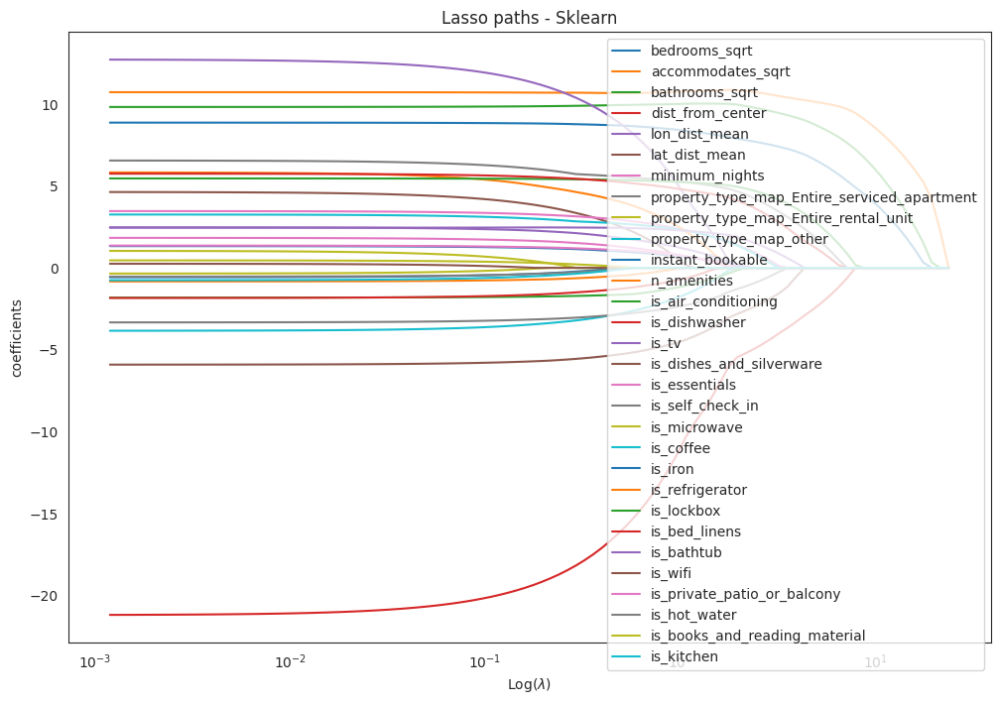

In [ ]:
# Lasso v2
sns.set_style("white")

# Pobierz wszystkie zmienne (włącznie z Intercept)
variables_used = model.model.exog_names
# Bez Intercept
variables_used = [var for var in model.model.exog_names if var != 'Intercept']

print(variables_used)

variables = variables_used

data_subset = data_encoded.loc[:, variables + ['price']]
data_subset.dropna(inplace=True)
# display(data_subset)

X = data_subset.loc[:,variables]
X = preprocessing.scale(X)
y = np.array(data_subset.price)

alphas_lasso, coefs_lasso, _ = lasso_path(X, y, eps = 5e-5)

# Display results
plt.figure(figsize = (12,8))

for i in range(X.shape[1]):
    plt.plot(alphas_lasso, coefs_lasso[i], label = variables[i])

plt.xscale('log')
plt.xlabel('Log($\\lambda$)')
plt.ylabel('coefficients')
plt.title('Lasso paths - Sklearn')
plt.legend()
plt.axis('tight')

In [ ]:
import plotly.graph_objects as go

# Istniejący kod do obliczenia lasso_path
alphas_lasso, coefs_lasso, _ = lasso_path(X, y, eps=5e-5)

# Tworzenie interaktywnego wykresu
fig = go.Figure()

for i in range(X.shape[1]):
    fig.add_trace(go.Scatter(
        x=alphas_lasso,
        y=coefs_lasso[i],
        mode='lines',
        name=variables[i],
        hovertemplate='<b>%{fullData.name}</b><br>' +
                      'λ: %{x:.2e}<br>' +
                      'Coefficient: %{y:.4f}<extra></extra>'
    ))

fig.update_xaxes(type="log", title="Log(λ)")
fig.update_yaxes(title="Coefficients")
fig.update_layout(
    title="Lasso Paths - Interactive",
    height=800,
    width=1200,
    hovermode='closest',
    plot_bgcolor='white',      # Tło obszaru wykresu
    paper_bgcolor='white',     # Tło całego rysunku
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=1.01
    )
)

fig.show()

In [ ]:
# # Lasso v1

# # variables = ['host_is_superhost', 'neighbourhood_cleansed', 'bathrooms', 'bedrooms', 'beds',
# variables = ['bathrooms', 'bedrooms', 'beds',
#              'accommodates', 'minimum_nights',
#              ] + ['is_wifi', 'is_tv', 'n_amenities']

# data_subset = data.loc[:, variables + ['price']]
# data_subset.dropna(inplace=True)
# # display(data_subset)

# X = data_subset.loc[:,variables]
# X = preprocessing.scale(X)
# y = np.array(data_subset.price)

# alphas_lasso, coefs_lasso, _ = lasso_path(X, y, eps = 5e-5)

# # Display results
# plt.figure(figsize = (12,8))

# for i in range(X.shape[1]):
#     plt.plot(alphas_lasso, coefs_lasso[i], label = variables[i])

# plt.xscale('log')
# plt.xlabel('Log($\\lambda$)')
# plt.ylabel('coefficients')
# plt.title('Lasso paths - Sklearn')
# plt.legend()
# plt.axis('tight')

# Analiza SHAP-a

nie ma ograniczeń ile wartości SHAP-a mogą wynosić.

Przy klasyfikacji - powinny sumować się do 1.

Guest_included - ile może być gości.

Bathrooms - może być korelacja z bedrooms.

### Google Drive connection

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Load & Save

In [ ]:
import pickle
import os

X = data_subset.loc[:,variables]
#X = preprocessing.scale(X) #We don't have to scale it as trees don't care about distributions, means, and all that smart stuff
Y = np.array(data_subset.price)

# Funkcja wrapper dla 4-krotnego logarytmu
def predict_original_scale(X):
    log4_predictions = model.predict(X)
    return np.exp(np.exp(np.exp(np.exp(log4_predictions))))

# x=X.iloc[:100] ### wycinek danych
# y=Y[:100]
x=X
y=Y
force_restart = 0

# Prefix dla nazw plików i nazwy zmiennych
pre = 'predictions_Prague_OLS'
expl = 'explainer'
shap_vals = 'shap_values'

# Ścieżka do Google Drive
SAVE_PATH = '/content/drive/MyDrive/shap_models/'

# Sprawdź czy pliki istnieją
files_exist = all([
    os.path.exists(f'{pre}_X_data.pkl'),
    os.path.exists(f'{pre}_{shap_vals}.pkl'),
    os.path.exists(f'{pre}_{expl}.pkl')
])

# Pełne ścieżki do plików
x_data_path = f'{SAVE_PATH}{pre}_X_data.pkl'
shap_vals_path = f'{SAVE_PATH}{pre}_{shap_vals}.pkl'
explainer_path = f'{SAVE_PATH}{pre}_{expl}.pkl'

# Sprawdź czy pliki istnieją
files_exist = all([
    os.path.exists(x_data_path),
    os.path.exists(shap_vals_path),
    os.path.exists(explainer_path)
])

# Logika: wczytaj tylko jeśli pliki istnieją & force_restart == 0
if files_exist and force_restart == 0:
    print("📂 Wczytywanie zapisanych danych SHAP z Google Drive...")

    with open(x_data_path, 'rb') as f:
        X = pickle.load(f)

    with open(shap_vals_path, 'rb') as f:
        shap_values = pickle.load(f)

    with open(explainer_path, 'rb') as f:
        explainer = pickle.load(f)

    print("✓ Dane SHAP wczytane pomyślnie z Google Drive!")

# Logika: licz ponownie jeśli force_restart == 1 lub brak plików
else:
    if force_restart == 1:
        print("🔄 force_restart=1 - Pomijam wczytywanie, tworzę model od nowa...")
    else:
        print("⚙️  Pliki SHAP nie znalezione. Tworzenie nowego modelu SHAP...")

    print("⏳ To może potrwać kilka minut...")

    ###############################
    # SHAP z funkcją wrapper
    explainer = shap.Explainer(predict_original_scale, X)
    shap_values = explainer(X)
    ###############################

    print("💾 Zapisywanie wyników do Google Drive...")

    # Zapisz wyniki do Google Drive
    with open(x_data_path, 'wb') as f:
        pickle.dump(x, f)

    with open(shap_vals_path, 'wb') as f:
        pickle.dump(shap_values, f)

    with open(explainer_path, 'wb') as f:
        pickle.dump(explainer, f)

    print(f"✓ Model SHAP utworzony i zapisany w {SAVE_PATH}!")

# Weryfikacja
print(f"\n📊 Kształt X: {x.shape}")
print(f"📊 Liczba obserwacji: {len(shap_values)}")

# Wyświetl rozmiary plików w Google Drive
print(f"\n📁 Pliki w {SAVE_PATH}:")
!ls -lh "{SAVE_PATH}"{pre}_*.pkl 2>/dev/null || echo "Pliki zapisane"

📂 Wczytywanie zapisanych danych SHAP z Google Drive...
✓ Dane SHAP wczytane pomyślnie z Google Drive!

📊 Kształt X: (7151, 30)
📊 Liczba obserwacji: 7151

📁 Pliki w /content/drive/MyDrive/shap_models/:
-rw------- 1 root root  50K Jan 14 21:32 /content/drive/MyDrive/shap_models/predictions_Prague_OLS_explainer.pkl
-rw------- 1 root root 3.4M Jan 14 21:32 /content/drive/MyDrive/shap_models/predictions_Prague_OLS_shap_values.pkl
-rw------- 1 root root 1.7M Jan 14 21:32 /content/drive/MyDrive/shap_models/predictions_Prague_OLS_X_data.pkl


In [ ]:
# W przypadku tego zbioru są jakieś dziwne anomalie, outliery dla części danych, poniżej je usuwam
import numpy as np
import pandas as pd

# Sprawdź długości
print(f"Długość X: {len(X)}, y: {len(y)}, x: {len(x)}, shap_values: {len(shap_values)}")

# Znajdź minimalną długość
min_len = min(len(X), len(y), len(x), len(shap_values))
print(f"⚠️ Przycinam wszystkie do minimalnej długości: {min_len}")

# Przytnij wszystkie do tej samej długości
if isinstance(X, pd.DataFrame):
    X = X.iloc[:min_len].reset_index(drop=True)
else:
    X = X[:min_len]

if isinstance(y, pd.Series):
    y = y.iloc[:min_len].reset_index(drop=True)
else:
    y = y[:min_len]

if isinstance(x, pd.DataFrame):
    x = x.iloc[:min_len].reset_index(drop=True)
else:
    x = x[:min_len]

shap_values = shap_values[:min_len]

print(f"✅ Po przycięciu: X={len(X)}, y={len(y)}, x={len(x)}, shap_values={len(shap_values)}")

# Teraz filtruj 1% z każdej strony
total_shap = np.abs(shap_values.values).sum(axis=1)
p1, p99 = np.percentile(total_shap, [1, 99])
mask = (total_shap >= p1) & (total_shap <= p99)

print(f"\nPrzed filtrowaniem: {len(X)} | Usuń: {(~mask).sum()} ({(~mask).sum()/len(mask)*100:.1f}%) | Po: {mask.sum()}")

# Filtruj z obsługą różnych typów
if isinstance(X, pd.DataFrame):
    X = X.iloc[mask].reset_index(drop=True)
else:
    X = X[mask]

if isinstance(y, pd.Series):
    y = y.iloc[mask].reset_index(drop=True)
else:
    y = y[mask]

if isinstance(x, pd.DataFrame):
    x = x.iloc[mask].reset_index(drop=True)
else:
    x = x[mask]

shap_values = shap_values[mask]

print(f"✅ Po filtrowaniu outlierów: X={len(X)}, y={len(y)}, x={len(x)}, shap_values={len(shap_values)}")

Długość X: 6591, y: 6591, x: 6591, shap_values: 6591
⚠️ Przycinam wszystkie do minimalnej długości: 6591
✅ Po przycięciu: X=6591, y=6591, x=6591, shap_values=6591

Przed filtrowaniem: 6591 | Usuń: 132 (2.0%) | Po: 6459
✅ Po filtrowaniu outlierów: X=6459, y=6459, x=6459, shap_values=6459


/tmp/ipython-input-186979797.py:1: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



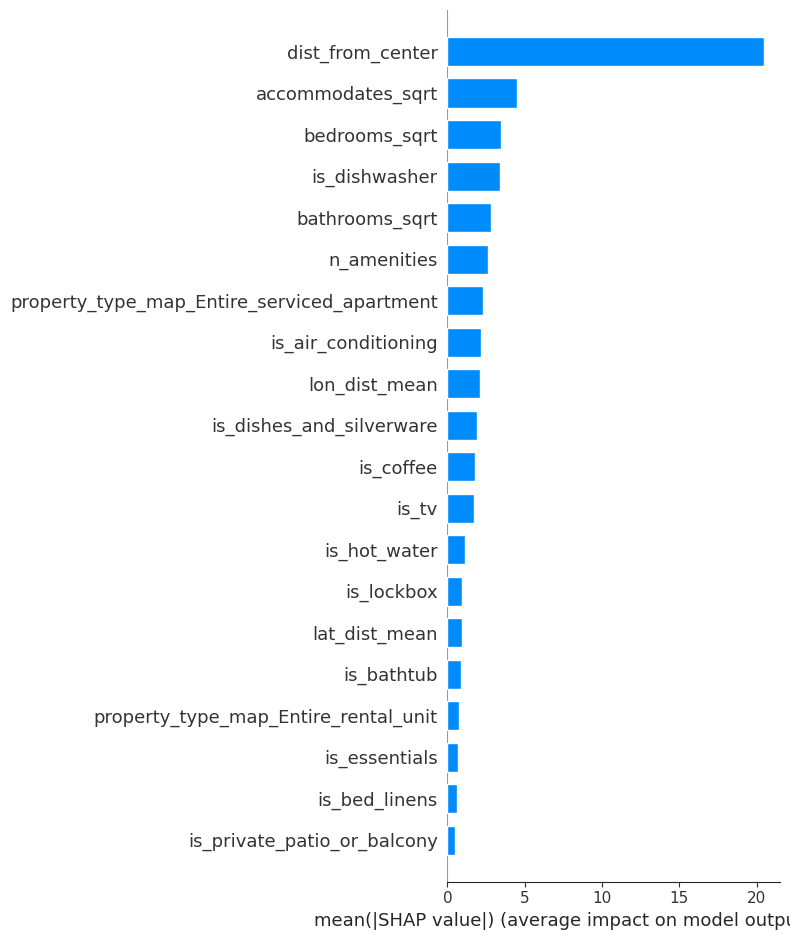

In [ ]:
shap.summary_plot(shap_values, x, plot_type="bar")

/tmp/ipython-input-1775113843.py:10: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



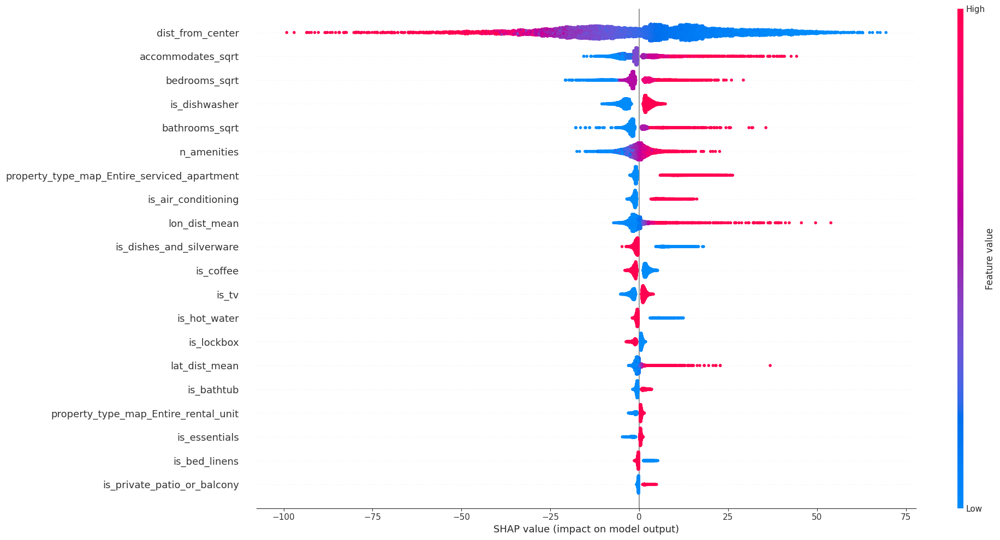

In [ ]:
#From official documentation:
'''The summary plot combines feature importance with feature effects.
Each point on the summary plot is a Shapley value for a feature and an instance.
The position on the y-axis is determined by the feature and on the x-axis by the Shapley value.
The color represents the value of the feature from low to high.
Overlapping points are jittered in y-axis direction, so we get a sense of the distribution
of the Shapley values per feature. The features are ordered according to their importance.'''
# So from this plot we can read that guests_included and bedrooms are the most important variables
#    and high number of guests_included/bedrooms is linked to higher price
shap.summary_plot(shap_values, features=x, feature_names=x.columns, plot_size=(20,10))

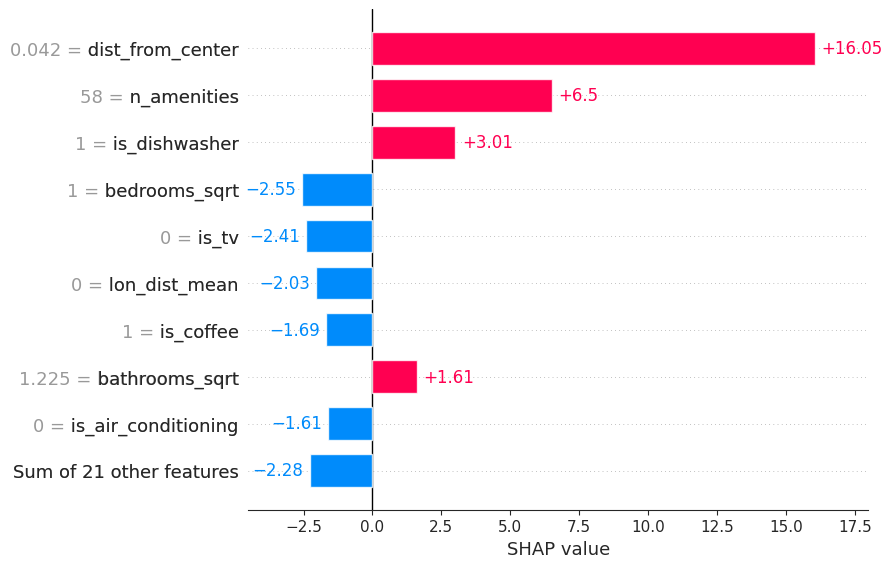

In [ ]:
shap.plots.bar(shap_values[0])

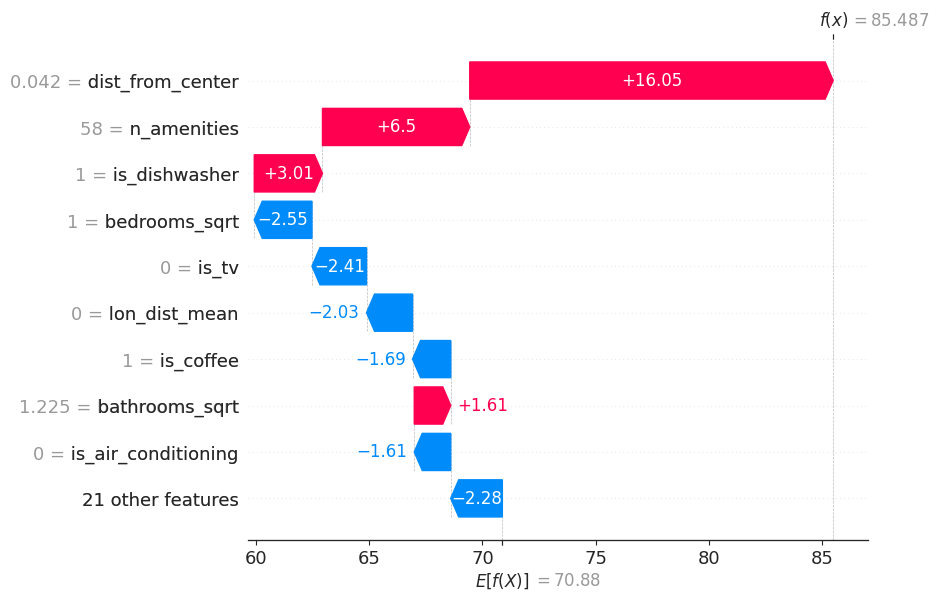

In [ ]:
shap.plots.waterfall(shap_values[0])

Najbardziej typowy przykład: indeks 342
Predykcja: 99.67, Średnia: 99.66


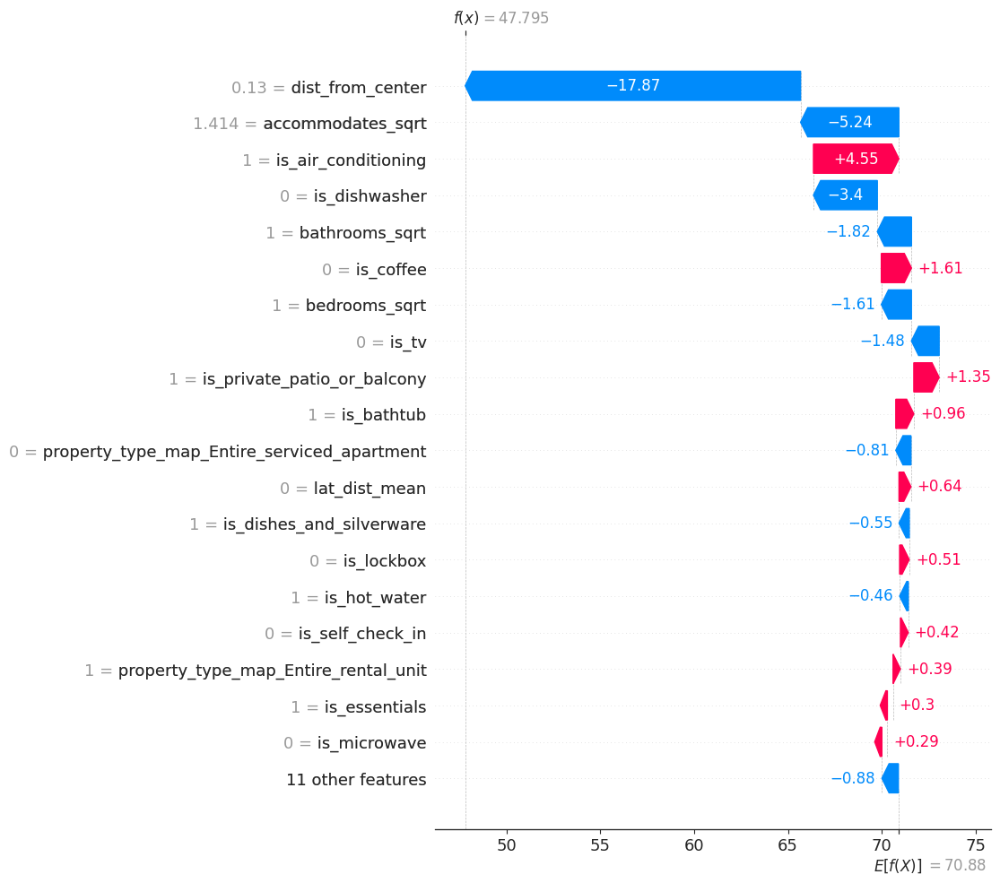

In [ ]:
# Oblicz predykcje dla najbardziej typowego przedstawiciela zbioru
# predictions = model.predict(x)

# Znajdź przykład najbliższy średniej predykcji
mean_prediction = predictions.mean()
idx_typical = np.abs(predictions - mean_prediction).argmin()  # argmin zamiast idxmin

print(f"Najbardziej typowy przykład: indeks {idx_typical}")
print(f"Predykcja: {predictions.iloc[idx_typical]:.2f}, Średnia: {mean_prediction:.2f}")

# Wyświetl SHAP dla tego przykładu
shap.plots.waterfall(shap_values[idx_typical], max_display=20)

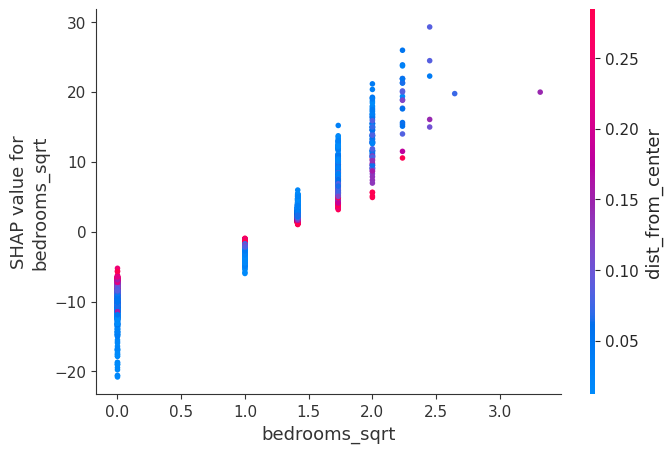

In [ ]:
# Wykres zależności dla wybranej zmiennej
variable_name = 'bedrooms_sqrt'

shap.dependence_plot(
    variable_name,
    shap_values.values,
    x,
    interaction_index='auto'  # Automatycznie znajdzie najsilniejszą interakcję
)

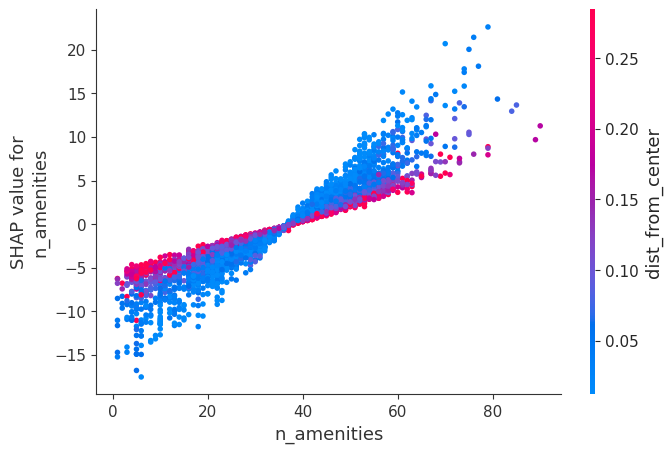

In [ ]:
# Wykres zależności dla wybranej zmiennej
variable_name = 'n_amenities'

shap.dependence_plot(
    variable_name,
    shap_values.values,
    x,
    interaction_index='auto'  # Automatycznie znajdzie najsilniejszą interakcję
)

### Single plot

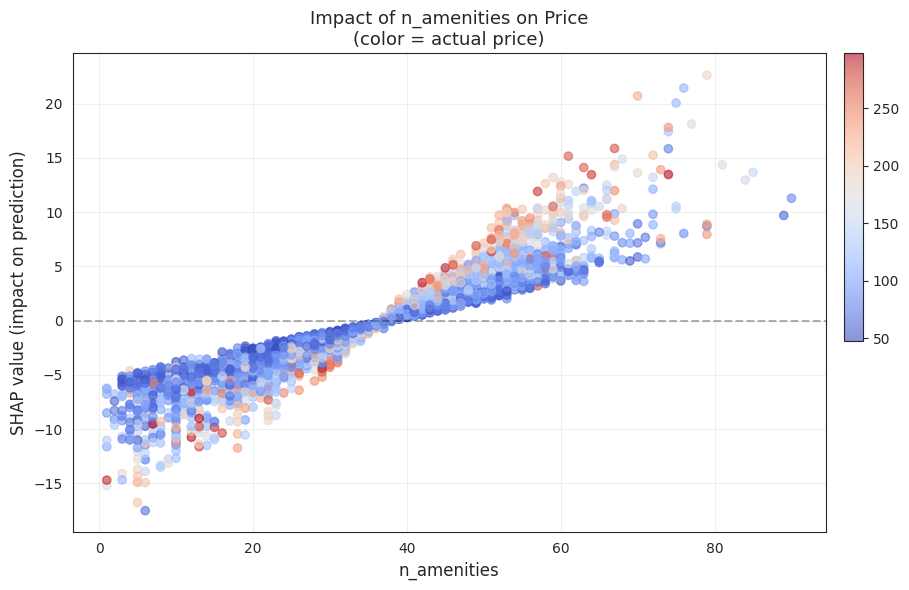

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))  # Dodaj rozmiar rysunku

variable_name = 'n_amenities'
variable_idx = list(x.columns).index(variable_name)

scatter = ax.scatter(  # Zmień axes na ax
    x[variable_name],
    shap_values.values[:, variable_idx],
    c=y,  # Kolor według rzeczywistej ceny
    cmap='coolwarm',
    alpha=0.6
)

# Colorbar - pionowy, zwężony, wyrównany do góry
cbar = fig.colorbar(
    scatter,
    orientation='vertical',
    pad=0.02,           # Odstęp od wykresu
    shrink=0.6,         # Wysokość: 60% wysokości wykresu
    aspect=15,          # Proporcje (wyższe = węższy)
    anchor=(0.0, 1.0)   # Wyrównanie do góry (1.0)
)
# cbar.ax.tick_params(labelsize=7)

# Zmień axes[i] na ax
ax.set_xlabel(variable_name, fontsize=12)
ax.set_ylabel('SHAP value (impact on prediction)', fontsize=12)
ax.set_title(f'Impact of {variable_name} on Price\n(color = actual price)', fontsize=13)
ax.axhline(y=0, color='black', linestyle='--', alpha=0.3)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

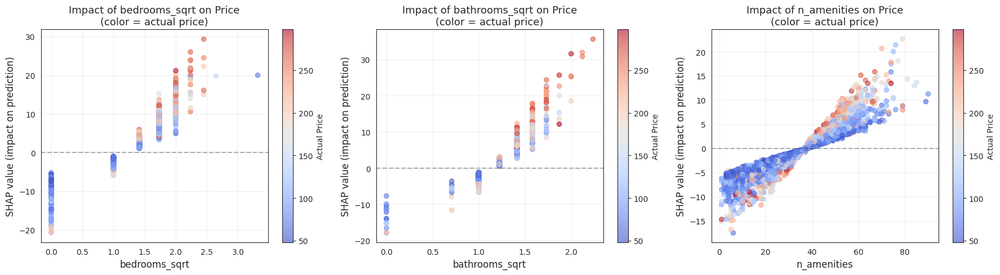

In [ ]:
import matplotlib.pyplot as plt

# Lista zmiennych do analizy
variables_to_plot = ['bedrooms_sqrt', 'bathrooms_sqrt', 'n_amenities']

# Stwórz subplot dla każdej zmiennej
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for i, variable_name in enumerate(variables_to_plot):
    variable_idx = list(x.columns).index(variable_name)

    # Wykres na konkretnym subplot
    scatter = axes[i].scatter(
        x[variable_name],
        shap_values.values[:, variable_idx],
        c=y,  # Kolor według rzeczywistej ceny
        cmap='coolwarm',
        alpha=0.6
    )

    # Colorbar dla każdego wykresu
    plt.colorbar(scatter, ax=axes[i], label='Actual Price')

    axes[i].set_xlabel(variable_name, fontsize=12)
    axes[i].set_ylabel('SHAP value (impact on prediction)', fontsize=12)
    axes[i].set_title(f'Impact of {variable_name} on Price\n(color = actual price)', fontsize=13)
    axes[i].axhline(y=0, color='black', linestyle='--', alpha=0.3)
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

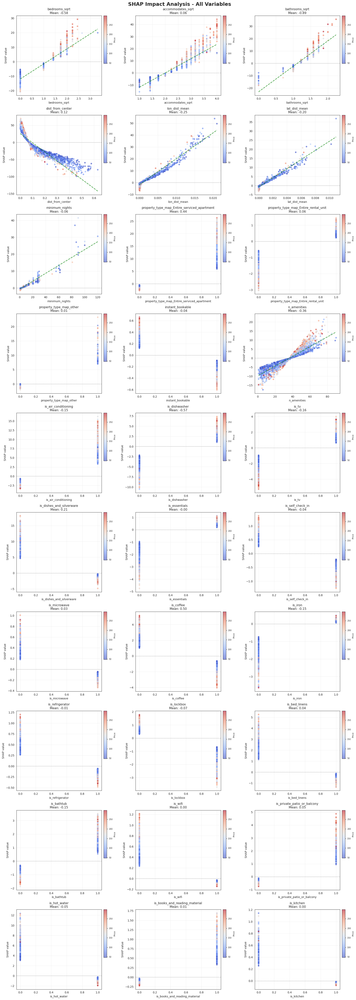

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

variables_to_plot = variables_used

# 3 kolumny
n_cols = 3
n_rows = int(np.ceil(len(variables_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
axes = axes.flatten()

for i, variable_name in enumerate(variables_to_plot):
    variable_idx = list(x.columns).index(variable_name)

    # Dane do wykresu
    x_data = x[variable_name]
    shap_data = shap_values.values[:, variable_idx]

    # Scatter plot
    scatter = axes[i].scatter(
        x_data,
        shap_data,
        c=y,
        cmap='coolwarm',
        alpha=0.6,
        s=20
    )

    # Colorbar - pionowy, zwężony, wyrównany do góry
    cbar = fig.colorbar(
        scatter,
        ax=axes[i],
        orientation='vertical',
        pad=0.02,           # Odstęp od wykresu
        shrink=0.6,         # Wysokość: 60% wysokości wykresu
        aspect=15,          # Proporcje (wyższe = węższy)
        anchor=(0.0, 1.0)   # Wyrównanie do góry (1.0)
    )
    cbar.set_label('Price', fontsize=8)
    cbar.ax.tick_params(labelsize=7)

    # Linia trendu
    if len(np.unique(x_data)) > 2:
        try:
            z = np.polyfit(x_data, shap_data, 1)
            p = np.poly1d(z)
            x_sorted = np.sort(x_data)
            axes[i].plot(x_sorted, p(x_sorted), "g--", linewidth=2, alpha=0.7)
        except:
            pass

    # Formatowanie
    axes[i].set_xlabel(variable_name, fontsize=10)
    axes[i].set_ylabel('SHAP value', fontsize=10)
    axes[i].set_title(f'{variable_name}\nMean: {shap_data.mean():.2f}', fontsize=11)
    axes[i].axhline(y=0, color='black', linestyle='--', alpha=0.3, linewidth=1)
    axes[i].grid(True, alpha=0.3)

# Usuń puste subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('SHAP Impact Analysis - All Variables', fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

### Multiplot ALL

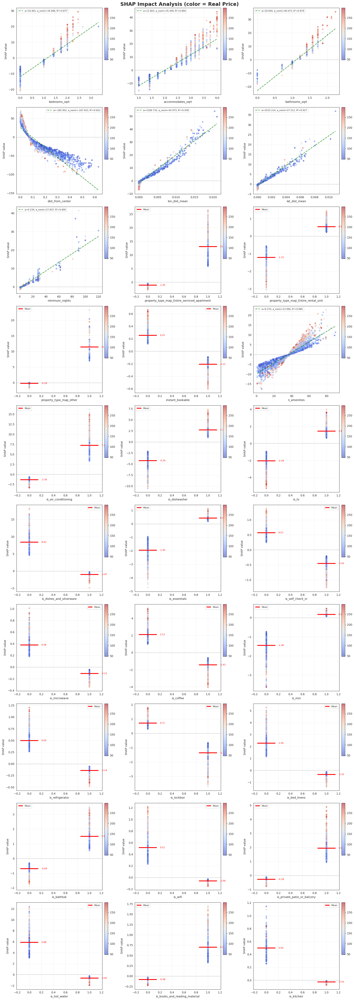


STATYSTYKI DLA ZMIENNYCH DYSKRETNYCH (≤4 wartości)

property_type_map_Entire_serviced_apartment:
  property_type_map_Entire_serviced_apartment=0: SHAP=   -1.05 (n=5773)
  property_type_map_Entire_serviced_apartment=1: SHAP=   13.04 (n=686)
  Różnica (1 vs 0):    14.09

property_type_map_Entire_rental_unit:
  property_type_map_Entire_rental_unit=0: SHAP=   -1.21 (n=1759)
  property_type_map_Entire_rental_unit=1: SHAP=    0.53 (n=4700)
  Różnica (1 vs 0):     1.74

property_type_map_other:
  property_type_map_other=0: SHAP=   -0.18 (n=6351)
  property_type_map_other=1: SHAP=   11.41 (n=108)
  Różnica (1 vs 0):    11.59

instant_bookable:
  instant_bookable=0: SHAP=    0.25 (n=2312)
  instant_bookable=1: SHAP=   -0.21 (n=4147)
  Różnica (1 vs 0):    -0.46

is_air_conditioning:
  is_air_conditioning=0: SHAP=   -1.36 (n=5547)
  is_air_conditioning=1: SHAP=    7.22 (n=912)
  Różnica (1 vs 0):     8.58

is_dishwasher:
  is_dishwasher=0: SHAP=   -4.26 (n=3033)
  is_dishwasher=1: SHAP=    2.70

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

variables_to_plot = variables_used
n_unique_limit = 4

# 3 kolumny
n_cols = 3
n_rows = int(np.ceil(len(variables_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
axes = axes.flatten()

for i, variable_name in enumerate(variables_to_plot):
    variable_idx = list(x.columns).index(variable_name)

    # Dane do wykresu
    x_data = x[variable_name]
    shap_data = shap_values.values[:, variable_idx]

    # Scatter plot
    scatter = axes[i].scatter(
        x_data,
        shap_data,
        c=y,
        cmap='coolwarm',
        alpha=0.6,
        s=20
    )

    # Colorbar
    cbar = fig.colorbar(
        scatter,
        ax=axes[i],
        orientation='vertical',
        pad=0.02,
        shrink=0.6,
        aspect=15,
        anchor=(0.0, 1.0)
    )

    # Sprawdź czy zmienna dyskretna (mało unikalnych wartości)
    unique_vals = np.unique(x_data)
    n_unique = len(unique_vals)

    if n_unique <= n_unique_limit:  # Zmienna dyskretna
        # Oblicz średnie SHAP dla każdej wartości
        for val in unique_vals:
            mask = x_data == val
            mean_shap = shap_data[mask].mean()

            # Pozioma linia pokazująca średnią
            axes[i].hlines(
                mean_shap,
                val - 0.15,
                val + 0.15,
                colors='red',
                linewidth=3,
                zorder=5,
                label='Mean' if val == unique_vals[0] else ''
            )

            # Tekst ze średnią
            axes[i].text(
                val + 0.2,
                mean_shap,
                f'{mean_shap:.2f}',
                fontsize=8,
                color='red',
                va='center'
            )
    else:  # Zmienna ciągła - linia trendu
        # try:
          # Regresja liniowa
          slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, shap_data)

          # Linia trendu
          x_sorted = np.sort(x_data)
          y_trend = slope * x_sorted + intercept

          # Znormalizowane nachylenie
          x_range = x_data.max() - x_data.min()
          slope_normalized = slope * x_range

          axes[i].plot(
              x_sorted,
              y_trend,
              "g--",
              linewidth=2,
              alpha=0.7,
              label=f'a={slope:.3f}, a_norm={slope_normalized:.3f}, R²={r_value**2:.3f}'
          )

    #         # Dodaj nachylenie i R² do tytułu
    #         axes[i].set_title(
    #             f'{variable_name}\nMean: {shap_data.mean():.2f}, a={slope:.3f}',
    #             fontsize=11
    #         )
    #     except:
    #         axes[i].set_title(f'{variable_name}\nMean: {shap_data.mean():.2f}', fontsize=11)

    # # Formatowanie (jeśli zmienna dyskretna, tytuł bez nachylenia)
    # if n_unique <= n_unique_limit:
    #     axes[i].set_title(f'{variable_name}\nMean: {shap_data.mean():.2f}', fontsize=11)

    axes[i].set_xlabel(variable_name, fontsize=10)
    axes[i].set_ylabel('SHAP value', fontsize=10)
    axes[i].axhline(y=0, color='black', linestyle='--', alpha=0.3, linewidth=1)
    axes[i].grid(True, alpha=0.3)

    # Legenda
    if n_unique <= n_unique_limit or n_unique > n_unique_limit:
        axes[i].legend(loc='best', fontsize=8)

# Usuń puste subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('SHAP Impact Analysis (color = Real Price)', fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# Statystyki dla zmiennych dyskretnych
print("\n" + "="*80)
print(f"STATYSTYKI DLA ZMIENNYCH DYSKRETNYCH (≤{n_unique_limit} wartości)")
print("="*80)

for variable_name in variables_to_plot:
    variable_idx = list(x.columns).index(variable_name)
    x_data = x[variable_name]
    shap_data = shap_values.values[:, variable_idx]
    unique_vals = np.unique(x_data)

    if len(unique_vals) <= n_unique_limit:  # Dyskretna zmienna
        print(f"\n{variable_name}:")
        for val in unique_vals:
            mask = x_data == val
            mean_shap = shap_data[mask].mean()
            count = mask.sum()
            print(f"  {variable_name}={val}: SHAP={mean_shap:>8.2f} (n={count})")

        # Różnica między wartościami (dla binarnych)
        if len(unique_vals) == 2:
            diff = shap_data[x_data == unique_vals[1]].mean() - shap_data[x_data == unique_vals[0]].mean()
            print(f"  Różnica ({unique_vals[1]} vs {unique_vals[0]}): {diff:>8.2f}")

# Statystyki dla zmiennych ciągłych
print("\n" + "="*80)
print(f"STATYSTYKI DLA ZMIENNYCH CIĄGŁYCH (>{n_unique_limit} wartości)")
print("="*80)

for variable_name in variables_to_plot:
    variable_idx = list(x.columns).index(variable_name)
    x_data = x[variable_name]
    shap_data = shap_values.values[:, variable_idx]
    unique_vals = np.unique(x_data)

    if len(unique_vals) > n_unique_limit:  # Ciągła zmienna
        try:
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, shap_data)

            # Dodatkowe statystyki
            x_min = x_data.min()
            x_max = x_data.max()
            x_range = x_max - x_min

            # Znormalizowane nachylenie (wpływ przejścia przez cały zakres)
            slope_normalized = slope * x_range

            print(f"\n{variable_name}:")
            print(f"  Nachylenie (a):              {slope:>10.4f}")
            print(f"  Przecięcie (b):              {intercept:>10.4f}")
            print(f"  R²:                          {r_value**2:>10.4f}")
            print(f"  Znormalizowane (a×range):    {slope_normalized:>10.4f}")
            print(f"  p-value:                     {p_value:>10.4e}")
            print(f"  Std error:                   {std_err:>10.4f}")
            print(f"  Feature min:                 {x_min:>10.4f}")
            print(f"  Feature max:                 {x_max:>10.4f}")
            print(f"  Feature range:               {x_range:>10.4f}")
            print(f"  Interpretacja:")
            print(f"    - 1 jednostka wzrostu → {slope:.4f} zmiana SHAP")
            print(f"    - Przejście min→max → {slope_normalized:.4f} zmiana SHAP")
            print(f"  ---------------------------------------")
        except:
            print(f"\n{variable_name}: Błąd w obliczeniu regresji")

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# variables_to_plot = variables_used

# # 3 kolumny
# n_cols = 3
# n_rows = int(np.ceil(len(variables_to_plot) / n_cols))

# fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
# axes = axes.flatten()

# for i, variable_name in enumerate(variables_to_plot):
#     variable_idx = list(x.columns).index(variable_name)

#     # Dane do wykresu
#     x_data = x[variable_name]
#     shap_data = shap_values.values[:, variable_idx]

#     # Scatter plot
#     scatter = axes[i].scatter(
#         x_data,
#         shap_data,
#         c=y,
#         cmap='coolwarm',
#         alpha=0.6,
#         s=20
#     )

#     # Colorbar
#     cbar = fig.colorbar(
#         scatter,
#         ax=axes[i],
#         orientation='vertical',
#         pad=0.02,
#         shrink=0.6,
#         aspect=15,
#         anchor=(0.0, 1.0)
#     )
#     # cbar.set_label('Price', fontsize=8)
#     # cbar.ax.tick_params(labelsize=7)

#     # Sprawdź czy zmienna dyskretna (mało unikalnych wartości)
#     unique_vals = np.unique(x_data)
#     n_unique = len(unique_vals)

#     if n_unique <= 10:  # Zmienna dyskretna
#         # Oblicz średnie SHAP dla każdej wartości
#         for val in unique_vals:
#             mask = x_data == val
#             mean_shap = shap_data[mask].mean()

#             # Pozioma linia pokazująca średnią
#             axes[i].hlines(
#                 mean_shap,
#                 val - 0.15,
#                 val + 0.15,
#                 colors='red',
#                 linewidth=3,
#                 zorder=5,
#                 label='Mean' if val == unique_vals[0] else ''
#             )

#             # Opcjonalnie: tekst ze średnią
#             axes[i].text(
#                 val + 0.2,
#                 mean_shap,
#                 f'{mean_shap:.2f}',
#                 fontsize=8,
#                 color='red',
#                 va='center'
#             )
#     else:  # Zmienna ciągła - linia trendu
#         try:
#             z = np.polyfit(x_data, shap_data, 1)
#             p = np.poly1d(z)
#             x_sorted = np.sort(x_data)
#             axes[i].plot(
#                 x_sorted,
#                 p(x_sorted),
#                 "g--",
#                 linewidth=2,
#                 alpha=0.7,
#                 label='Trend'
#             )
#         except:
#             pass

#     # Formatowanie
#     axes[i].set_xlabel(variable_name, fontsize=10)
#     axes[i].set_ylabel('SHAP value', fontsize=10)
#     axes[i].set_title(f'{variable_name}\nMean: {shap_data.mean():.2f}', fontsize=11)
#     axes[i].axhline(y=0, color='black', linestyle='--', alpha=0.3, linewidth=1)
#     axes[i].grid(True, alpha=0.3)

#     # Legenda tylko jeśli są czerwone linie
#     if n_unique <= 10:
#         axes[i].legend(loc='best', fontsize=8)

# # Usuń puste subplots
# for j in range(i+1, len(axes)):
#     fig.delaxes(axes[j])

# plt.suptitle('SHAP Impact Analysis - All Variables', fontsize=18, fontweight='bold', y=0.995)
# plt.tight_layout()
# plt.show()

# # Statystyki dla zmiennych dyskretnych
# print("\n" + "="*80)
# print("STATYSTYKI DLA ZMIENNYCH DYSKRETNYCH (0/1)")
# print("="*80)

# for variable_name in variables_to_plot:
#     variable_idx = list(x.columns).index(variable_name)
#     x_data = x[variable_name]
#     shap_data = shap_values.values[:, variable_idx]
#     unique_vals = np.unique(x_data)

#     if len(unique_vals) <= 2:  # Binarna zmienna
#         print(f"\n{variable_name}:")
#         for val in unique_vals:
#             mask = x_data == val
#             mean_shap = shap_data[mask].mean()
#             count = mask.sum()
#             print(f"  {variable_name}={val}: SHAP={mean_shap:>8.2f} (n={count})")

#         # Różnica między 1 a 0
#         if len(unique_vals) == 2:
#             diff = shap_data[x_data == 1].mean() - shap_data[x_data == 0].mean()
#             print(f"  Różnica (1 vs 0): {diff:>8.2f}")

### Multiplot ALL - Reversed

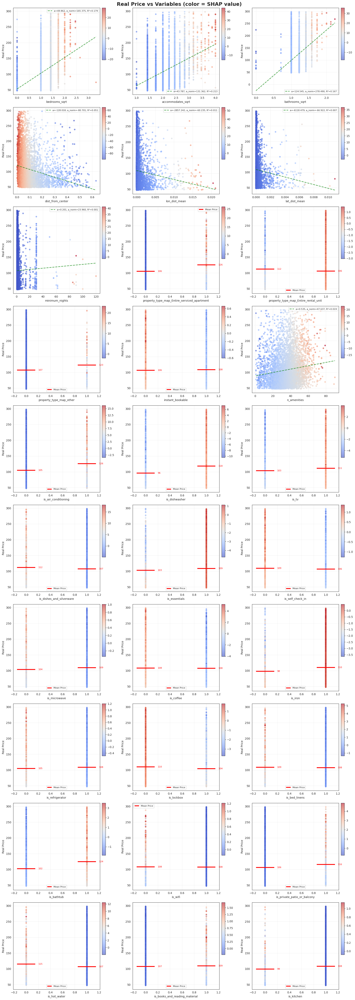


STATYSTYKI DLA ZMIENNYCH DYSKRETNYCH - REAL PRICE

property_type_map_Entire_serviced_apartment:
  property_type_map_Entire_serviced_apartment=0: Mean Price=     106 (n=5773)
  property_type_map_Entire_serviced_apartment=1: Mean Price=     126 (n=686)
  Różnica cen (1 vs 0):       20

property_type_map_Entire_rental_unit:
  property_type_map_Entire_rental_unit=0: Mean Price=     112 (n=1759)
  property_type_map_Entire_rental_unit=1: Mean Price=     106 (n=4700)
  Różnica cen (1 vs 0):       -6

property_type_map_other:
  property_type_map_other=0: Mean Price=     107 (n=6351)
  property_type_map_other=1: Mean Price=     123 (n=108)
  Różnica cen (1 vs 0):       16

instant_bookable:
  instant_bookable=0: Mean Price=     106 (n=2312)
  instant_bookable=1: Mean Price=     108 (n=4147)
  Różnica cen (1 vs 0):        2

is_air_conditioning:
  is_air_conditioning=0: Mean Price=     105 (n=5547)
  is_air_conditioning=1: Mean Price=     126 (n=912)
  Różnica cen (1 vs 0):       21

is_dishwas

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

variables_to_plot = variables_used
n_unique_limit = 4

# 3 kolumny
n_cols = 3
n_rows = int(np.ceil(len(variables_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
axes = axes.flatten()

for i, variable_name in enumerate(variables_to_plot):
    variable_idx = list(x.columns).index(variable_name)

    # Dane do wykresu
    x_data = x[variable_name]
    shap_data = shap_values.values[:, variable_idx]
    y_data = y  # Real price

    # Scatter plot - ODWRÓCONY: oś Y = Real Price, kolor = SHAP
    scatter = axes[i].scatter(
        x_data,           # x: zmienna
        y_data,           # y: Real Price (było: shap_data)
        c=shap_data,      # kolor: SHAP value (było: y)
        cmap='coolwarm',
        alpha=0.6,
        s=20
    )

    # Colorbar
    cbar = fig.colorbar(
        scatter,
        ax=axes[i],
        orientation='vertical',
        pad=0.02,
        shrink=0.6,
        aspect=15,
        anchor=(0.0, 1.0)
    )
    # cbar.set_label('SHAP value', fontsize=8)
    # cbar.ax.tick_params(labelsize=7)

    # Sprawdź czy zmienna dyskretna (mało unikalnych wartości)
    unique_vals = np.unique(x_data)
    n_unique = len(unique_vals)

    if n_unique <= n_unique_limit:  # Zmienna dyskretna
        # Oblicz średnie Real Price dla każdej wartości
        for val in unique_vals:
            mask = x_data == val
            mean_price = y_data[mask].mean()

            # Pozioma linia pokazująca średnią cenę
            axes[i].hlines(
                mean_price,
                val - 0.15,
                val + 0.15,
                colors='red',
                linewidth=3,
                zorder=5,
                label='Mean Price' if val == unique_vals[0] else ''
            )

            # Tekst ze średnią
            axes[i].text(
                val + 0.2,
                mean_price,
                f'{mean_price:.0f}',
                fontsize=8,
                color='red',
                va='center'
            )
    else:  # Zmienna ciągła - linia trendu
        # try:
          # Regresja liniowa: Real Price vs zmienna
          slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)

          # Linia trendu
          x_sorted = np.sort(x_data)
          y_trend = slope * x_sorted + intercept

          # Znormalizowane nachylenie
          x_range = x_data.max() - x_data.min()
          slope_normalized = slope * x_range

          axes[i].plot(
              x_sorted,
              y_trend,
              "g--",
              linewidth=2,
              alpha=0.7,
              label=f'a={slope:.3f}, a_norm={slope_normalized:.3f}, R²={r_value**2:.3f}'
          )

          # # Dodaj nachylenie i R² do tytułu
          # axes[i].set_title(
          #     f'f'a={slope:.3f}, a_norm={slope_normalized:.3f}, R²={r_value**2:.3f}',
          #     fontsize=11
          # )
        # except:
        #     axes[i].set_title(f'{variable_name}\nMean Price: {y_data.mean():.0f}', fontsize=11)

    # # Formatowanie (jeśli zmienna dyskretna, tytuł bez nachylenia)
    # if n_unique <= n_unique_limit:
    #     axes[i].set_title(f'{variable_name}\nMean Price: {y_data.mean():.0f}', fontsize=11)

    axes[i].set_xlabel(variable_name, fontsize=10)
    axes[i].set_ylabel('Real Price', fontsize=10)  # ZMIENIONE
    axes[i].grid(True, alpha=0.3)

    # Legenda
    if n_unique <= n_unique_limit or n_unique > n_unique_limit:
        axes[i].legend(loc='best', fontsize=8)

# Usuń puste subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Real Price vs Variables (color = SHAP value)', fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# Statystyki dla zmiennych dyskretnych
print("\n" + "="*80)
print("STATYSTYKI DLA ZMIENNYCH DYSKRETNYCH - REAL PRICE")
print("="*80)

for variable_name in variables_to_plot:
    variable_idx = list(x.columns).index(variable_name)
    x_data = x[variable_name]
    y_data = y
    unique_vals = np.unique(x_data)

    if len(unique_vals) <= n_unique_limit:
        print(f"\n{variable_name}:")
        for val in unique_vals:
            mask = x_data == val
            mean_price = y_data[mask].mean()
            count = mask.sum()
            print(f"  {variable_name}={val}: Mean Price={mean_price:>8.0f} (n={count})")

        # Różnica w cenach
        if len(unique_vals) == 2:
            diff = y_data[x_data == unique_vals[1]].mean() - y_data[x_data == unique_vals[0]].mean()
            print(f"  Różnica cen ({unique_vals[1]} vs {unique_vals[0]}): {diff:>8.0f}")

# Statystyki dla zmiennych ciągłych
print("\n" + "="*80)
print("STATYSTYKI DLA ZMIENNYCH CIĄGŁYCH - REAL PRICE vs VARIABLE")
print("="*80)

for variable_name in variables_to_plot:
    variable_idx = list(x.columns).index(variable_name)
    x_data = x[variable_name]
    y_data = y
    unique_vals = np.unique(x_data)

    if len(unique_vals) > n_unique_limit:  # Ciągła zmienna
        try:
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)

            # Dodatkowe statystyki
            x_min = x_data.min()
            x_max = x_data.max()
            x_range = x_max - x_min

            # Znormalizowane nachylenie (wpływ przejścia przez cały zakres)
            slope_normalized = slope * x_range

            print(f"\n{variable_name}:")
            print(f"  Nachylenie (a):              {slope:>10.4f}")
            print(f"  Przecięcie (b):              {intercept:>10.4f}")
            print(f"  R²:                          {r_value**2:>10.4f}")
            print(f"  Znormalizowane (a×range):    {slope_normalized:>10.4f}")
            print(f"  p-value:                     {p_value:>10.4e}")
            print(f"  Std error:                   {std_err:>10.4f}")
            print(f"  Feature min:                 {x_min:>10.4f}")
            print(f"  Feature max:                 {x_max:>10.4f}")
            print(f"  Feature range:               {x_range:>10.4f}")
            print(f"  Interpretacja:")
            print(f"    - 1 jednostka wzrostu → {slope:.4f} EUR zmiana ceny")
            print(f"    - Przejście min→max → {slope_normalized:.4f} EUR zmiana ceny")
            print(f"  ---------------------------------------")
        except:
            print(f"\n{variable_name}: Błąd w obliczeniu regresji")